In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.pylab import rcParams
import warnings
warnings.filterwarnings('ignore')
rcParams['figure.figsize'] = 8,4.5


In [2]:
df1 = pd.read_csv('prices.csv',header =0)
df1

,date,symbol,open,close,low,high,volume
0,2016-01-05 00:00:00,WLTW,123.430000,125.839996,122.309998,126.250000,2163600.0
1,2016-01-06 00:00:00,WLTW,125.239998,119.980003,119.940002,125.540001,2386400.0
2,2016-01-07 00:00:00,WLTW,116.379997,114.949997,114.930000,119.739998,2489500.0
3,2016-01-08 00:00:00,WLTW,115.480003,116.620003,113.500000,117.440002,2006300.0
4,2016-01-11 00:00:00,WLTW,117.010002,114.970001,114.089996,117.330002,1408600.0
...,...,...,...,...,...,...,...
851259,2016-12-30,ZBH,103.309998,103.199997,102.849998,103.930000,973800.0
851260,2016-12-30,ZION,43.070000,43.040001,42.689999,43.310001,1938100.0
851261,2016-12-30,ZTS,53.639999,53.529999,53.270000,53.740002,1701200.0
851262,2016-12-30 00:00:00,AIV,44.730000,45.450001,44.410000,45.590000,1380900.0


In [3]:
print(df1.isnull().sum())

date      0
symbol    0
open      0
close     0
low       0
high      0
volume    0
dtype: int64


In [4]:
df1.dtypes

date       object
symbol     object
open      float64
close     float64
low       float64
high      float64
volume    float64
dtype: object

In [5]:
x = df1.iloc[:,2:6].values
x = np.delete(x,1,axis = 1)
x

array([[123.43    , 122.309998, 126.25    ],
       [125.239998, 119.940002, 125.540001],
       [116.379997, 114.93    , 119.739998],
       ...,
       [ 53.639999,  53.27    ,  53.740002],
       [ 44.73    ,  44.41    ,  45.59    ],
       [ 54.200001,  53.389999,  54.48    ]])

In [6]:
y = df1.iloc[:,3].values
y

array([125.839996, 119.980003, 114.949997, ...,  53.529999,  45.450001,
        53.630001])

In [7]:
display(pd.DataFrame(x).corr())

,0,1,2
0,1.000000,0.999916,0.999930
1,0.999916,1.000000,0.999892
2,0.999930,0.999892,1.000000


In [8]:
from sklearn.preprocessing import StandardScaler
sc_x= StandardScaler()
x = sc_x.fit_transform(x)
print (x)


[[ 0.62838275  0.62974564  0.64767927]
 [ 0.65000865  0.60114918  0.63927348]
 [ 0.54414912  0.5406983   0.57060632]
 ...
 [-0.20547007 -0.20329361 -0.21077817]
 [-0.31192697 -0.3101987  -0.30726735]
 [-0.19877915 -0.20184569 -0.20201722]]


In [9]:
from sklearn.decomposition import PCA
pca = PCA(n_components = 1)
PCA_X = pca.fit_transform(x)
print (pd.DataFrame(PCA_X))


               0
0       1.100319
1       1.091441
2       0.955777
3       0.923885
4       0.937798
...          ...
851259  0.673397
851260 -0.575603
851261 -0.357693
851262 -0.536585
851263 -0.347936

[851264 rows x 1 columns]


In [10]:
print (pca.explained_variance_ratio_)

[0.99994181]


In [11]:

from sklearn.model_selection import train_test_split
PCA_X_train,PCA_X_test, y_train,y_test = train_test_split(PCA_X,y,test_size=0.2,random_state=42)
print (PCA_X.shape)
print (PCA_X_train.shape)
print (PCA_X_test.shape)



(851264, 1)
(681011, 1)
(170253, 1)


In [12]:
#to creat linear model
from sklearn.linear_model import LinearRegression
lr = LinearRegression()
lr.fit(PCA_X_train,y_train)


LinearRegression()

In [13]:
y_pred = lr.predict(PCA_X_test)
y_pred

array([56.89130649, 12.17442157, 10.99180916, ..., 88.42166739,
       45.5899637 , 57.32826747])

In [14]:
#to check accuracy
from sklearn.metrics import r2_score
acc = r2_score(y_test,y_pred)
acc

0.9998593095727476

In [75]:
def Plotting_Prediction_VsActual(trainY,train_pred):
    trainY = pd.DataFrame(trainY).tail(100)
    train_pred = pd.DataFrame(train_pred).tail(100)
    print("Red - Predicted Stock Prices  ,  Blue - Actual Stock Prices")
    plt.rcParams["figure.figsize"] = (15,7)
    plt.plot(trainY  ,color='blue', label='Actual', alpha=0.9)
    plt.plot(train_pred, color='red', label='Prediction', alpha=0.5)
    plt.xlabel('Time')
    plt.ylabel('Stock Prices')
    plt.legend(fontsize = 14)
    plt.title('Pediction VS Reality Over Time')
    plt.grid(True)
    plt.show()


In [71]:
def Model_Details(y_test, y_pred):
    from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error
    r2 = r2_score(y_test, y_pred)
    mae = mean_absolute_error(y_test, y_pred)
    rmse = mean_squared_error(y_test, y_pred, squared=False)

    print(f"R² Score        : {r2:.4f}")
    print(f"MAE (Error)     : {mae:.2f}")
    print(f"RMSE (Error)    : {rmse:.2f}")
    print(f"Maximum Actual Price: {max(y_test):.2f}")
    print(f"Maximum Predicted Price  : {max(y_pred):.2f}")
    print(f"Minimum Actual Price   : {min(y_test):.2f}")
    print(f"Minimum Predicted Price  : {min(y_pred):.2f}")


In [17]:
def Model_Prediction_Actual_Graph(x,y):
    from sklearn.preprocessing import StandardScaler
    from sklearn.decomposition import PCA
    from sklearn.model_selection import train_test_split
    from sklearn.linear_model import LinearRegression
    sc_x= StandardScaler()
    x = sc_x.fit_transform(x)
    pca = PCA(n_components = 1)
    PCA_X = pca.fit_transform(x)
    PCA_X_train,PCA_X_test, y_train,y_test = train_test_split(PCA_X,y,test_size=0.2,random_state=42)
    lr = LinearRegression()
    lr.fit(PCA_X_train,y_train)
    y_pred = lr.predict(PCA_X_test)
    Plotting_Prediction_VsActual(y_test,y_pred)
    Model_Details(y_test,y_pred)

In [63]:
def x_y_values(data):
    x = data.iloc[:,2:6].values
    x = np.delete(x,1,axis = 1)
    y = data.iloc[:,3].values
    noise = np.random.normal(0, y.std() * 0.2, size=len(y))  
    y = y + noise
    return x,y

In [19]:
def print_sideways(data_list, cols=4):
    from math import ceil
    rows = ceil(len(data_list) / cols)
    for r in range(rows):
        row_items = []
        for c in range(cols):
            idx = r + c * rows
            if idx < len(data_list):
                row_items.append(f"{data_list[idx]:<20}")
        print(" | ".join(row_items))

In [78]:
def Model_Prediction():
    df1 = pd.read_csv('prices.csv',header =0 )
    df2 = pd.read_csv('securities.csv',header = 0)
    codes = df2['Ticker symbol'].unique()
    w ='''Select Feature to Use:
    1.Prediction Vs Actual Stock Prices for One Company
    2.Prediction Vs Actual Stock Prices for Multiple Companies
    3.Prediction Vs Actual Stock Prices for All Companies
    '''
    print(w)
    ch_1 = int(input("Enter Choice(1/2/3):"))
    if(ch_1 == 1):
        print_sideways(codes,6)
        company_required = input("Enter Company Code to Search:")
        f = df2.loc[df2['Ticker symbol'] == company_required].values[0]
        col = df2.columns
        for j in range(len(col)):
            if(col[j]!='Date first added'):
                print(col[j],':',f[j])
        data = df1.loc[df1.symbol.str.startswith(company_required) , :]
        x,y = x_y_values(data)
        Model_Prediction_Actual_Graph(x,y)
    elif(ch_1 == 2):
        print_sideways(codes,6)
        custom_codes = eval(input("Enter A List of Companies Using their Codes:"))
        for i in custom_codes:
            f = df2.loc[df2['Ticker symbol'] == i].values[0]
            col = df2.columns
            for j in range(len(col)):
                if(col[j]!='Date first added'):
                    print(col[j],':',f[j])
            data = df1.loc[df1.symbol.str.startswith(i) , :]
            x,y = x_y_values(data)
            Model_Prediction_Actual_Graph(x,y)
    elif(ch_1==3):
        print_sideways(codes,6)
        for i in codes:
            f = df2.loc[df2['Ticker symbol'] == i].values[0]
            col = df2.columns
            for j in range(len(col)):
                if(col[j]!='Date first added'):
                    print(col[j],':',f[j])
            data = df1.loc[df1.symbol.str.startswith(i) , :]
            x,y = x_y_values(data)
            Model_Prediction_Actual_Graph(x,y)
    else:
        print("Enter A Valid Choice")
        
            


Select Feature to Use:
    1.Prediction Vs Actual Stock Prices for One Company
    2.Prediction Vs Actual Stock Prices for Multiple Companies
    3.Prediction Vs Actual Stock Prices for All Companies
    


Enter Choice(1/2/3): 3


MMM                  | CCL                  | EQR                  | JPM                  | ORLY                 | TGT                 
ABT                  | CAT                  | ESS                  | JNPR                 | OXY                  | TEL                 
ABBV                 | CBG                  | EL                   | KSU                  | OMC                  | TGNA                
ACN                  | CBS                  | ES                   | K                    | OKE                  | TDC                 
ATVI                 | CELG                 | EXC                  | KEY                  | ORCL                 | TSO                 
AYI                  | CNC                  | EXPE                 | KMB                  | PCAR                 | TXN                 
ADBE                 | CNP                  | EXPD                 | KIM                  | PH                   | TXT                 
AAP                  | CTL                  | ES

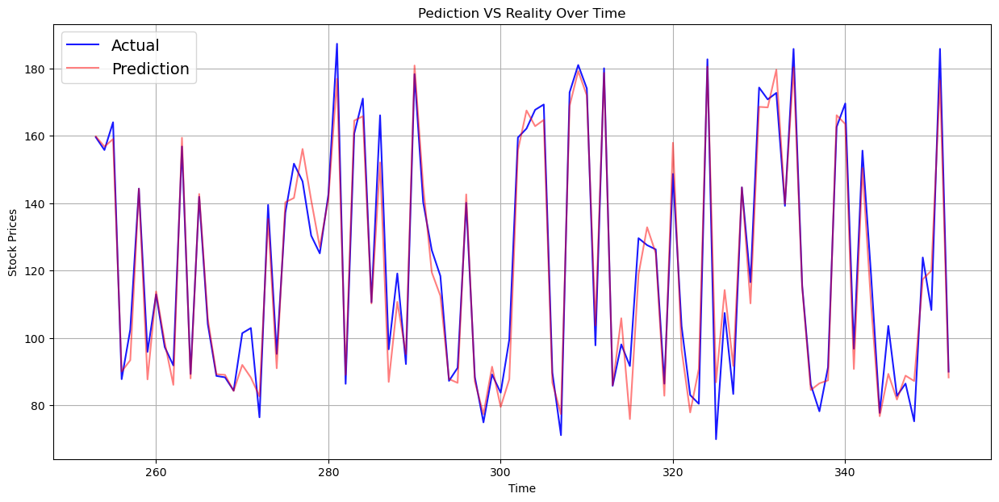

R² Score        : 0.9591
MAE (Error)     : 5.70
RMSE (Error)    : 7.13
Maximum Actual Price: 193.06
Maximum Predicted Price  : 182.18
Minimum Actual Price   : 58.37
Minimum Predicted Price  : 74.61
Ticker symbol : ABT
Security : Abbott Laboratories
SEC filings : reports
GICS Sector : Health Care
GICS Sub Industry : Health Care Equipment
Address of Headquarters : North Chicago, Illinois
CIK : 1800
Red - Predicted Stock Prices  ,  Blue - Actual Stock Prices


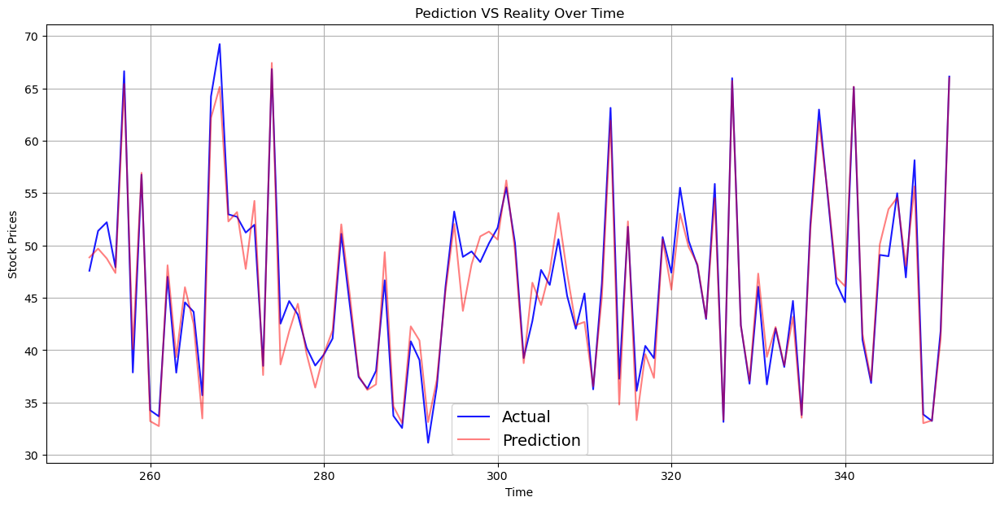

R² Score        : 0.9598
MAE (Error)     : 1.37
RMSE (Error)    : 1.74
Maximum Actual Price: 71.25
Maximum Predicted Price  : 70.09
Minimum Actual Price   : 31.08
Minimum Predicted Price  : 32.75
Ticker symbol : ABBV
Security : AbbVie
SEC filings : reports
GICS Sector : Health Care
GICS Sub Industry : Pharmaceuticals
Address of Headquarters : North Chicago, Illinois
CIK : 1551152
Red - Predicted Stock Prices  ,  Blue - Actual Stock Prices


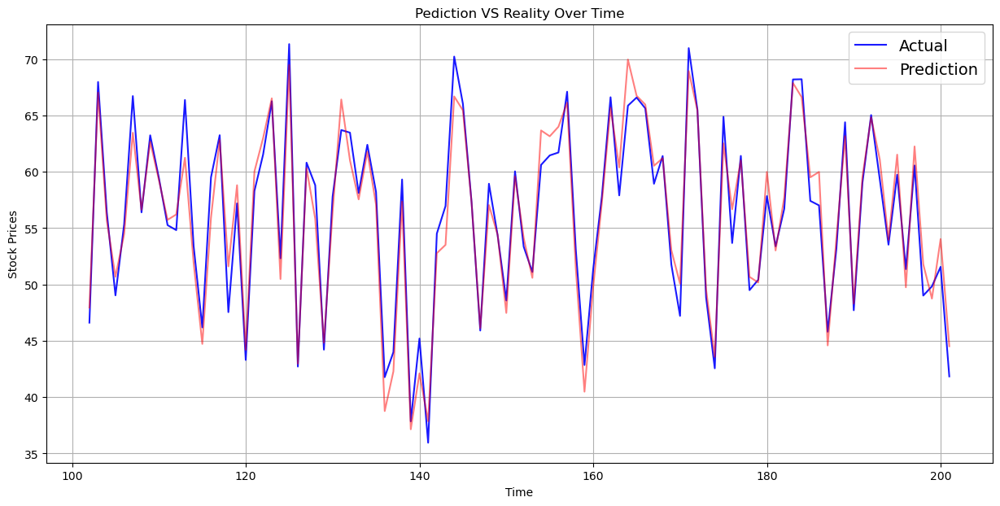

R² Score        : 0.9534
MAE (Error)     : 1.44
RMSE (Error)    : 1.82
Maximum Actual Price: 72.80
Maximum Predicted Price  : 69.96
Minimum Actual Price   : 35.35
Minimum Predicted Price  : 35.01
Ticker symbol : ACN
Security : Accenture plc
SEC filings : reports
GICS Sector : Information Technology
GICS Sub Industry : IT Consulting & Other Services
Address of Headquarters : Dublin, Ireland
CIK : 1467373
Red - Predicted Stock Prices  ,  Blue - Actual Stock Prices


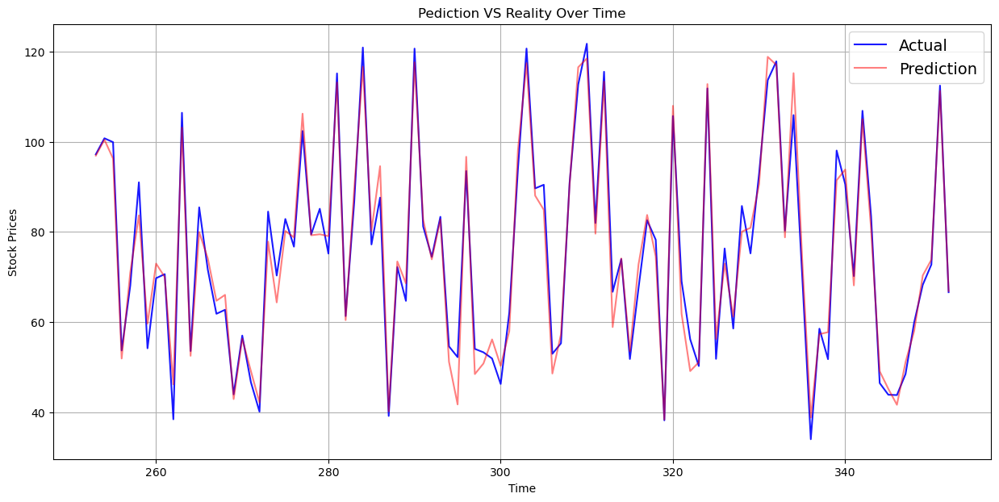

R² Score        : 0.9647
MAE (Error)     : 3.56
RMSE (Error)    : 4.46
Maximum Actual Price: 127.68
Maximum Predicted Price  : 125.03
Minimum Actual Price   : 29.63
Minimum Predicted Price  : 36.83
Ticker symbol : ATVI
Security : Activision Blizzard
SEC filings : reports
GICS Sector : Information Technology
GICS Sub Industry : Home Entertainment Software
Address of Headquarters : Santa Monica, California
CIK : 718877
Red - Predicted Stock Prices  ,  Blue - Actual Stock Prices


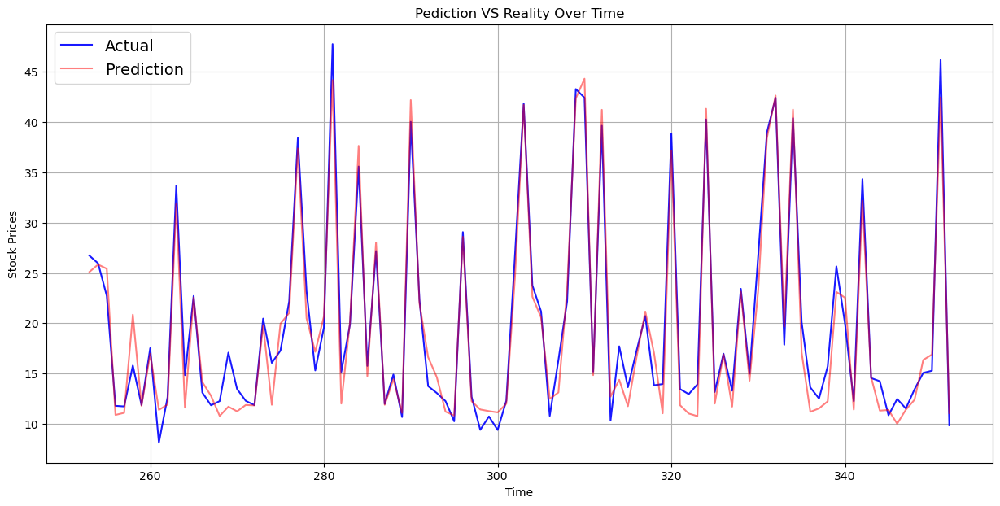

R² Score        : 0.9658
MAE (Error)     : 1.53
RMSE (Error)    : 1.89
Maximum Actual Price: 47.75
Maximum Predicted Price  : 44.81
Minimum Actual Price   : 6.42
Minimum Predicted Price  : 10.01
Ticker symbol : AYI
Security : Acuity Brands Inc
SEC filings : reports
GICS Sector : Industrials
GICS Sub Industry : Electrical Components & Equipment
Address of Headquarters : Atlanta, Georgia
CIK : 1144215
Red - Predicted Stock Prices  ,  Blue - Actual Stock Prices


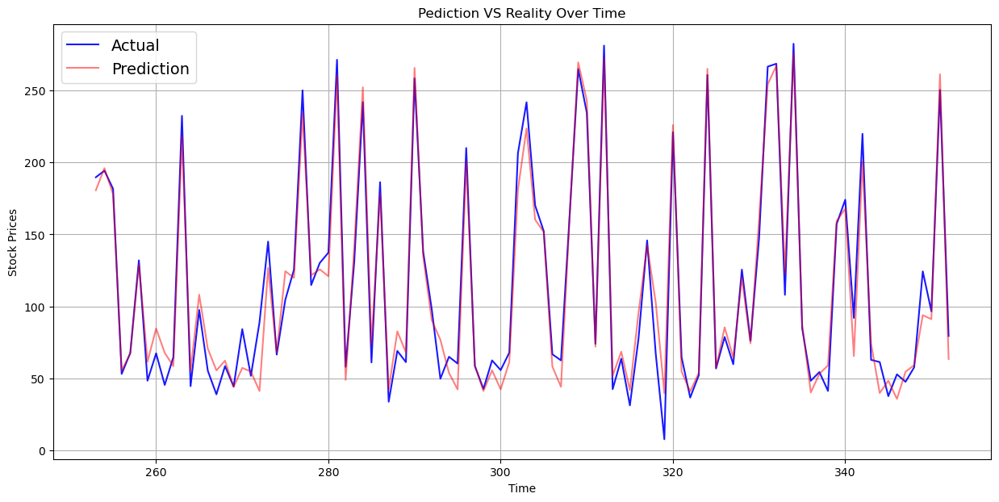

R² Score        : 0.9667
MAE (Error)     : 10.81
RMSE (Error)    : 13.75
Maximum Actual Price: 286.46
Maximum Predicted Price  : 276.01
Minimum Actual Price   : 7.55
Minimum Predicted Price  : 34.14
Ticker symbol : ADBE
Security : Adobe Systems Inc
SEC filings : reports
GICS Sector : Information Technology
GICS Sub Industry : Application Software
Address of Headquarters : San Jose, California
CIK : 796343
Red - Predicted Stock Prices  ,  Blue - Actual Stock Prices


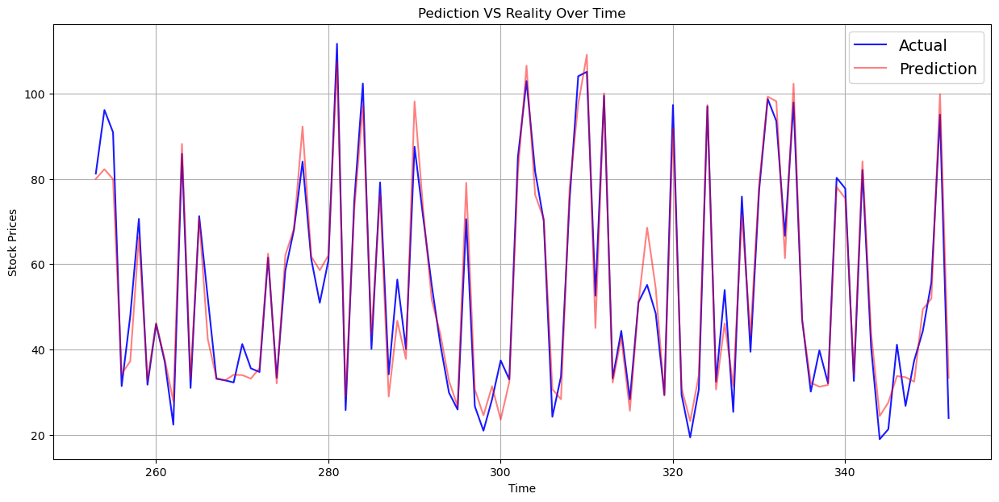

R² Score        : 0.9620
MAE (Error)     : 4.19
RMSE (Error)    : 5.19
Maximum Actual Price: 112.92
Maximum Predicted Price  : 109.23
Minimum Actual Price   : 15.70
Minimum Predicted Price  : 22.93
Ticker symbol : AAP
Security : Advance Auto Parts
SEC filings : reports
GICS Sector : Consumer Discretionary
GICS Sub Industry : Automotive Retail
Address of Headquarters : Roanoke, Virginia
CIK : 1158449
Red - Predicted Stock Prices  ,  Blue - Actual Stock Prices


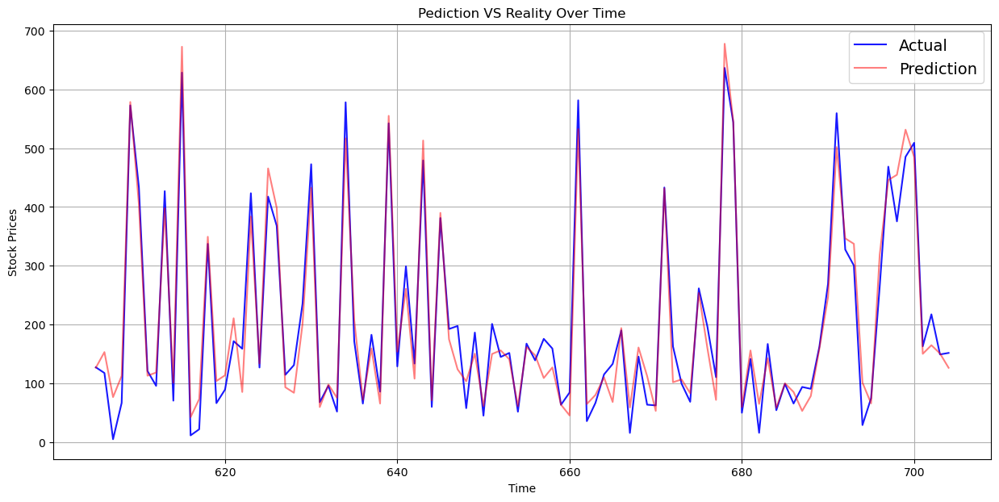

R² Score        : 0.9528
MAE (Error)     : 29.96
RMSE (Error)    : 37.00
Maximum Actual Price: 727.96
Maximum Predicted Price  : 700.69
Minimum Actual Price   : -57.34
Minimum Predicted Price  : 39.86
Ticker symbol : AES
Security : AES Corp
SEC filings : reports
GICS Sector : Utilities
GICS Sub Industry : Independent Power Producers & Energy Traders
Address of Headquarters : Arlington, Virginia
CIK : 874761
Red - Predicted Stock Prices  ,  Blue - Actual Stock Prices


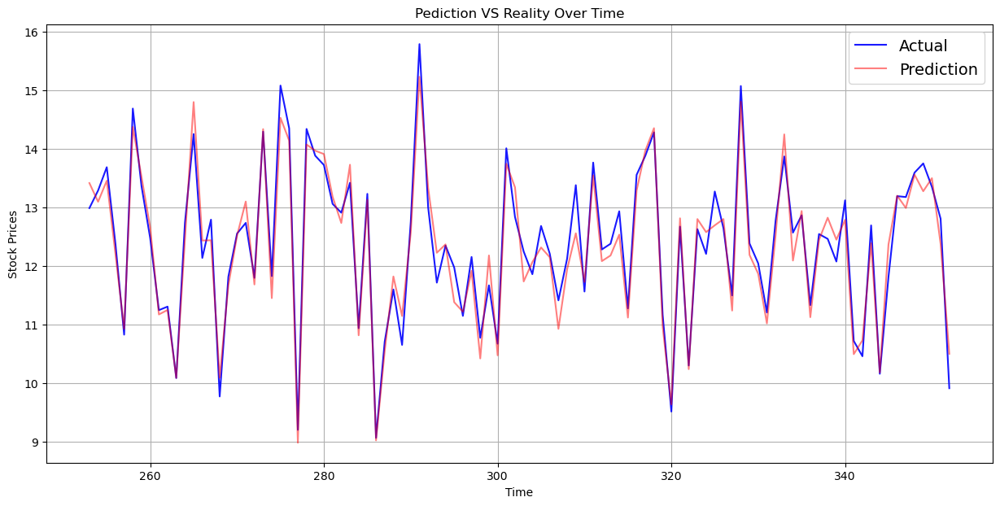

R² Score        : 0.9468
MAE (Error)     : 0.25
RMSE (Error)    : 0.32
Maximum Actual Price: 15.98
Maximum Predicted Price  : 15.40
Minimum Actual Price   : 8.93
Minimum Predicted Price  : 8.98
Ticker symbol : AET
Security : Aetna Inc
SEC filings : reports
GICS Sector : Health Care
GICS Sub Industry : Managed Health Care
Address of Headquarters : Hartford, Connecticut
CIK : 1122304
Red - Predicted Stock Prices  ,  Blue - Actual Stock Prices


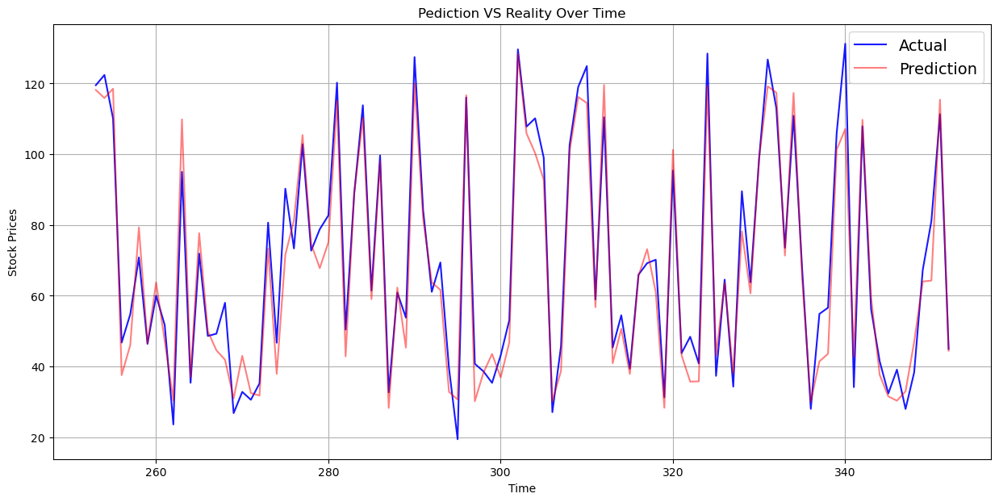

R² Score        : 0.9607
MAE (Error)     : 5.28
RMSE (Error)    : 6.64
Maximum Actual Price: 141.34
Maximum Predicted Price  : 132.45
Minimum Actual Price   : 16.03
Minimum Predicted Price  : 25.57
Ticker symbol : AMG
Security : Affiliated Managers Group Inc
SEC filings : reports
GICS Sector : Financials
GICS Sub Industry : Asset Management & Custody Banks
Address of Headquarters : Beverly, Massachusetts
CIK : 1004434
Red - Predicted Stock Prices  ,  Blue - Actual Stock Prices


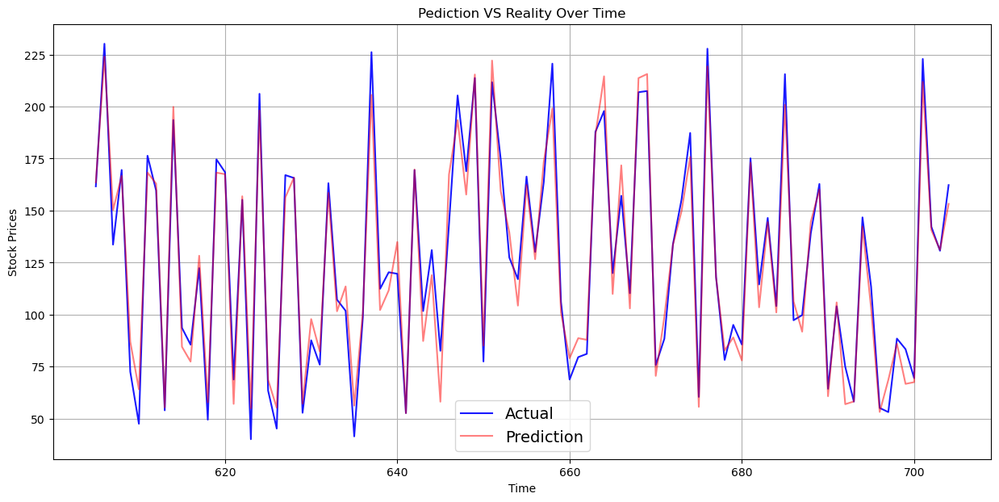

R² Score        : 0.9618
MAE (Error)     : 7.74
RMSE (Error)    : 9.71
Maximum Actual Price: 239.52
Maximum Predicted Price  : 227.55
Minimum Actual Price   : 33.89
Minimum Predicted Price  : 49.26
Ticker symbol : AFL
Security : AFLAC Inc
SEC filings : reports
GICS Sector : Financials
GICS Sub Industry : Life & Health Insurance
Address of Headquarters : Columbus, Georgia
CIK : 4977
Red - Predicted Stock Prices  ,  Blue - Actual Stock Prices


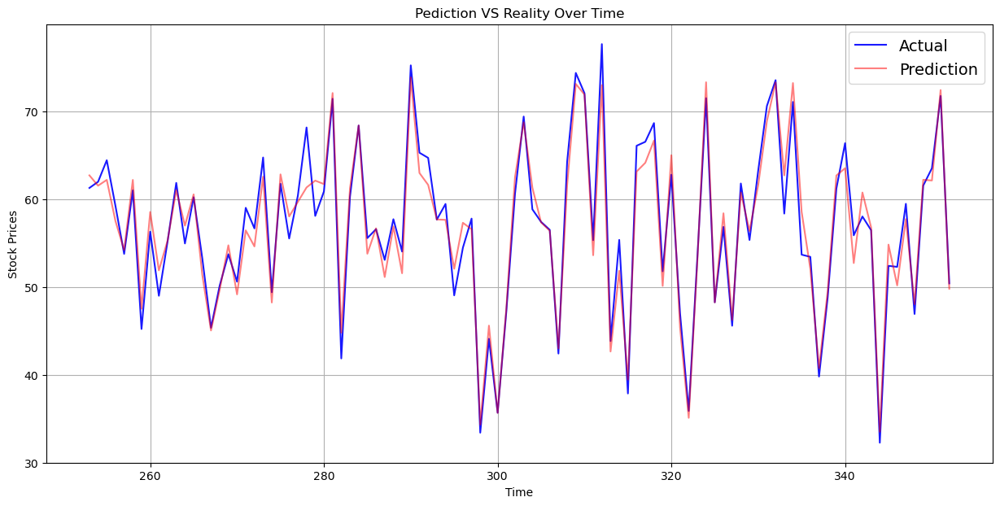

R² Score        : 0.9583
MAE (Error)     : 1.60
RMSE (Error)    : 1.98
Maximum Actual Price: 77.70
Maximum Predicted Price  : 73.91
Minimum Actual Price   : 32.06
Minimum Predicted Price  : 33.51
Ticker symbol : A
Security : Agilent Technologies Inc
SEC filings : reports
GICS Sector : Health Care
GICS Sub Industry : Health Care Equipment
Address of Headquarters : Santa Clara, California
CIK : 1090872
Red - Predicted Stock Prices  ,  Blue - Actual Stock Prices


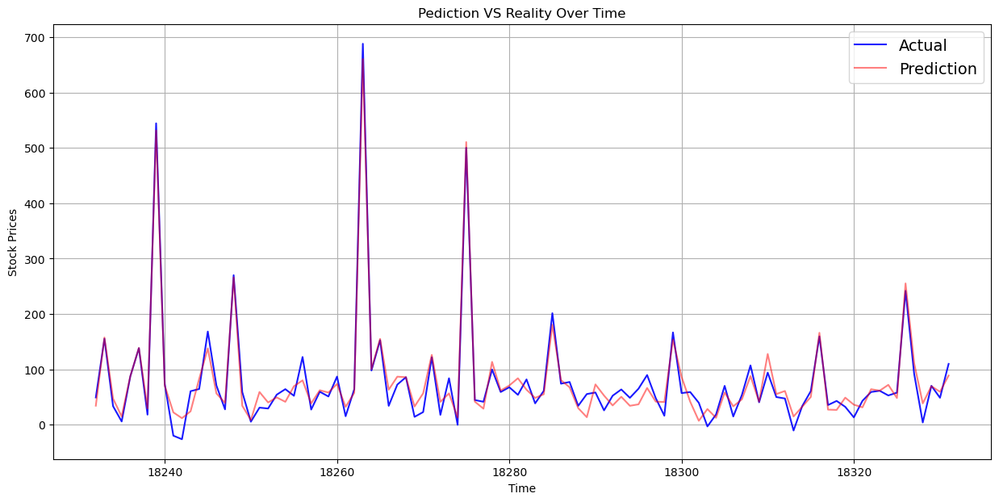

R² Score        : 0.9640
MAE (Error)     : 15.54
RMSE (Error)    : 19.42
Maximum Actual Price: 855.10
Maximum Predicted Price  : 839.07
Minimum Actual Price   : -58.38
Minimum Predicted Price  : 4.18
Ticker symbol : APD
Security : Air Products & Chemicals Inc
SEC filings : reports
GICS Sector : Materials
GICS Sub Industry : Industrial Gases
Address of Headquarters : Allentown, Pennsylvania
CIK : 2969
Red - Predicted Stock Prices  ,  Blue - Actual Stock Prices


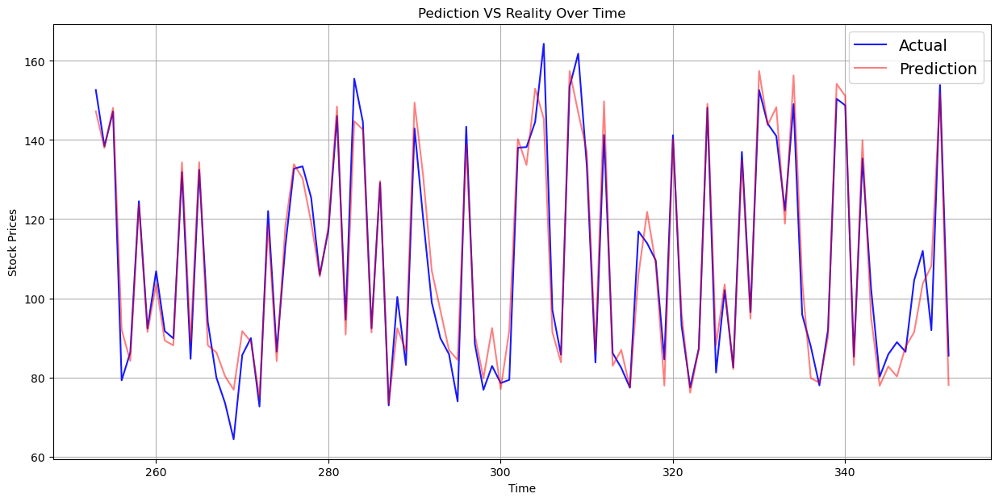

R² Score        : 0.9567
MAE (Error)     : 4.61
RMSE (Error)    : 5.73
Maximum Actual Price: 164.33
Maximum Predicted Price  : 157.67
Minimum Actual Price   : 52.31
Minimum Predicted Price  : 65.16
Ticker symbol : AKAM
Security : Akamai Technologies Inc
SEC filings : reports
GICS Sector : Information Technology
GICS Sub Industry : Internet Software & Services
Address of Headquarters : Cambridge, Massachusetts
CIK : 1086222
Red - Predicted Stock Prices  ,  Blue - Actual Stock Prices


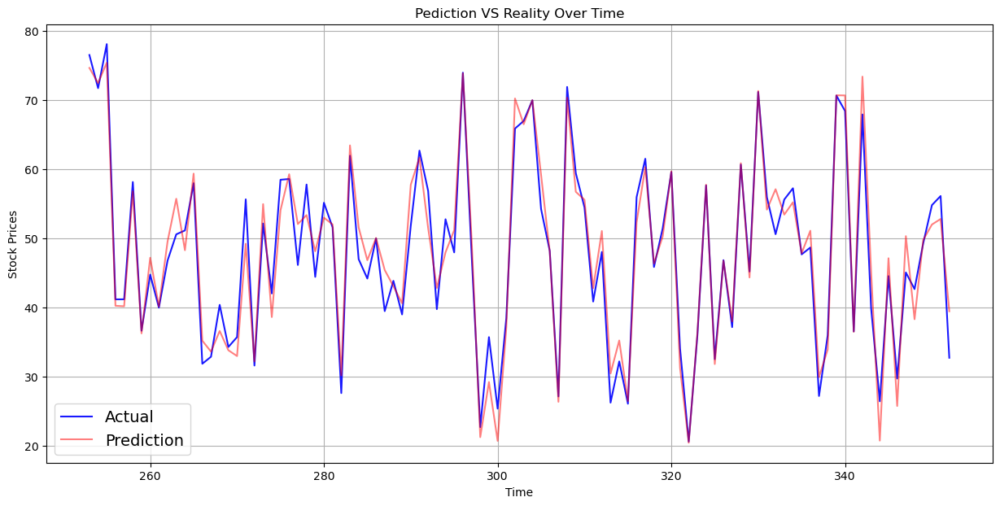

R² Score        : 0.9571
MAE (Error)     : 2.36
RMSE (Error)    : 2.96
Maximum Actual Price: 81.43
Maximum Predicted Price  : 78.08
Minimum Actual Price   : 17.82
Minimum Predicted Price  : 20.28
Ticker symbol : ALK
Security : Alaska Air Group Inc
SEC filings : reports
GICS Sector : Industrials
GICS Sub Industry : Airlines
Address of Headquarters : Seattle, Washington
CIK : 766421
Red - Predicted Stock Prices  ,  Blue - Actual Stock Prices


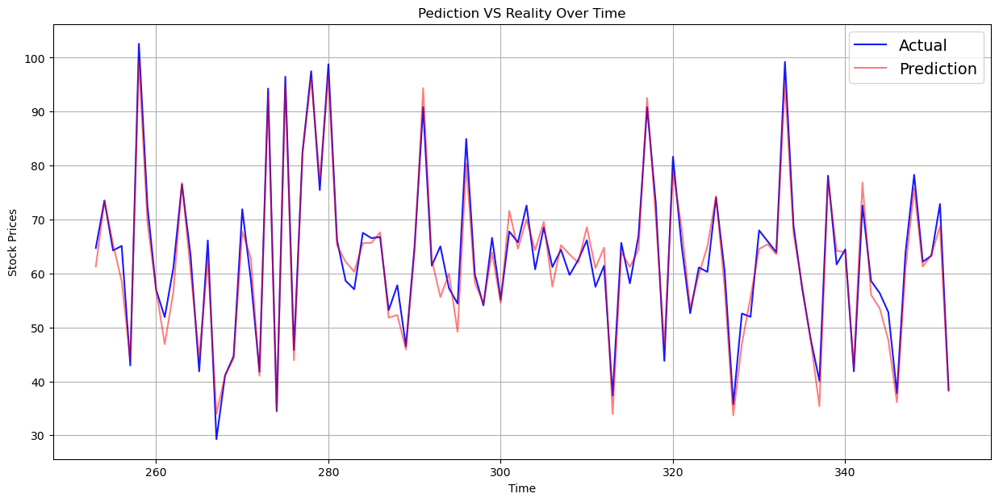

R² Score        : 0.9567
MAE (Error)     : 2.62
RMSE (Error)    : 3.30
Maximum Actual Price: 102.57
Maximum Predicted Price  : 100.21
Minimum Actual Price   : 24.09
Minimum Predicted Price  : 31.95
Ticker symbol : ALB
Security : Albemarle Corp
SEC filings : reports
GICS Sector : Materials
GICS Sub Industry : Specialty Chemicals
Address of Headquarters : Baton Rouge, Louisiana
CIK : 915913
Red - Predicted Stock Prices  ,  Blue - Actual Stock Prices


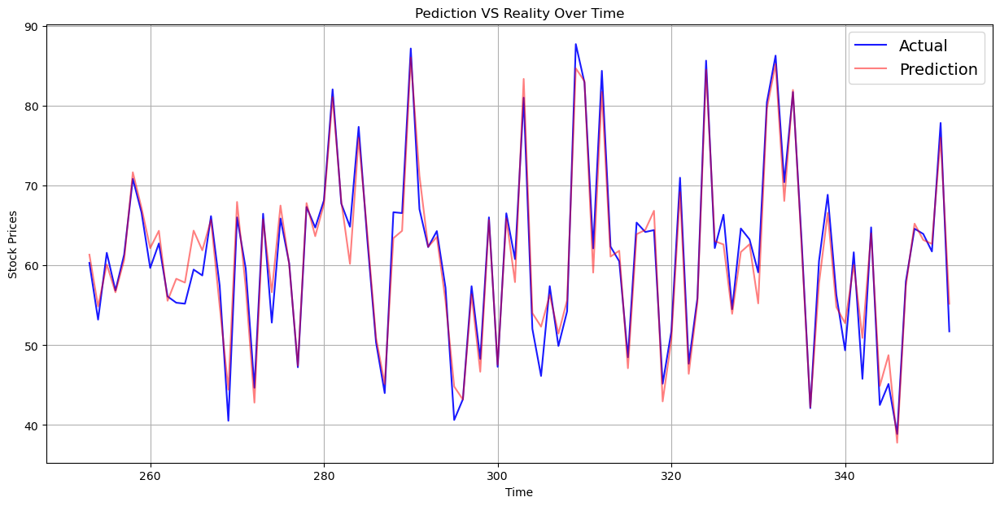

R² Score        : 0.9576
MAE (Error)     : 1.98
RMSE (Error)    : 2.44
Maximum Actual Price: 91.94
Maximum Predicted Price  : 90.92
Minimum Actual Price   : 34.59
Minimum Predicted Price  : 35.36
Ticker symbol : ALXN
Security : Alexion Pharmaceuticals
SEC filings : reports
GICS Sector : Health Care
GICS Sub Industry : Biotechnology
Address of Headquarters : Cheshire, Connecticut
CIK : 899866
Red - Predicted Stock Prices  ,  Blue - Actual Stock Prices


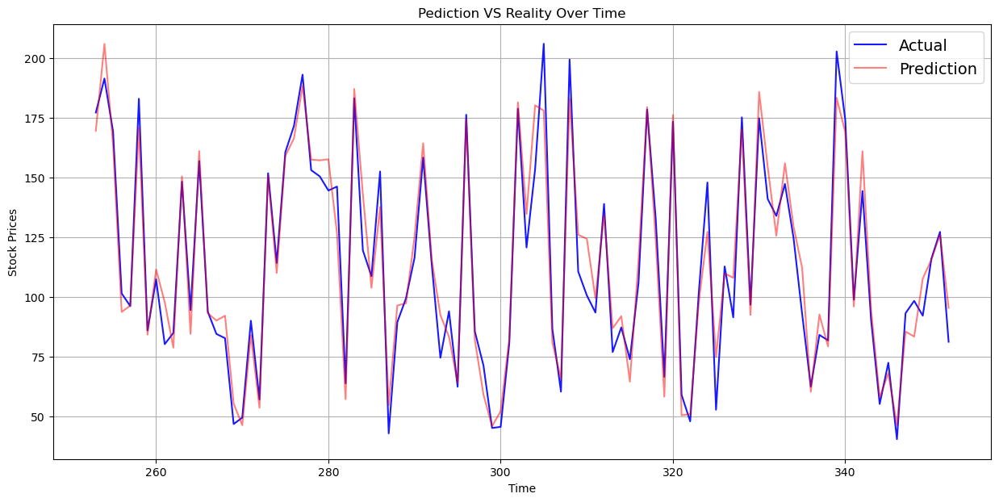

R² Score        : 0.9564
MAE (Error)     : 7.51
RMSE (Error)    : 9.37
Maximum Actual Price: 207.57
Maximum Predicted Price  : 205.80
Minimum Actual Price   : 35.28
Minimum Predicted Price  : 44.96
Ticker symbol : ALLE
Security : Allegion
SEC filings : reports
GICS Sector : Industrials
GICS Sub Industry : Building Products
Address of Headquarters : Dublin, Ireland
CIK : 1579241
Red - Predicted Stock Prices  ,  Blue - Actual Stock Prices


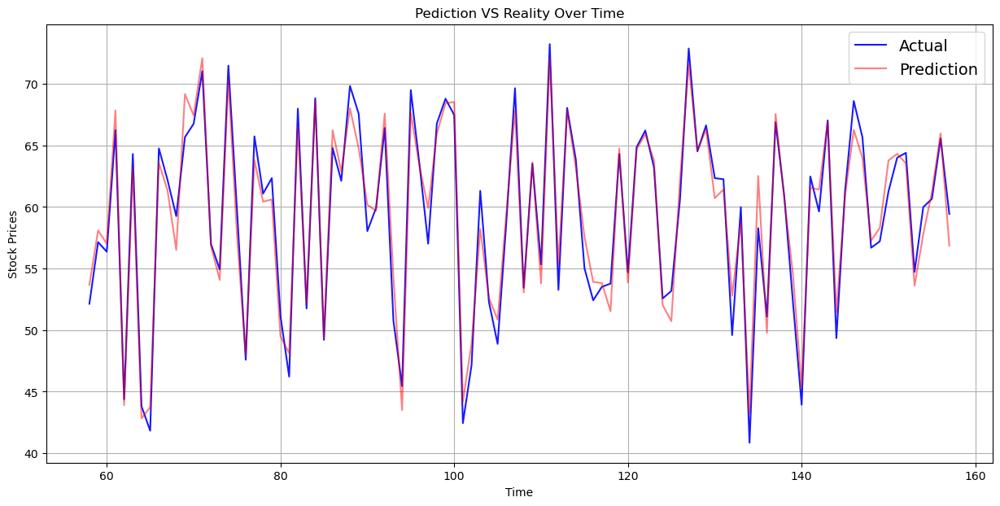

R² Score        : 0.9586
MAE (Error)     : 1.29
RMSE (Error)    : 1.57
Maximum Actual Price: 73.49
Maximum Predicted Price  : 72.72
Minimum Actual Price   : 40.85
Minimum Predicted Price  : 42.83
Ticker symbol : AGN
Security : Allergan, Plc
SEC filings : reports
GICS Sector : Health Care
GICS Sub Industry : Pharmaceuticals
Address of Headquarters : Dublin, Ireland
CIK : 884629
Red - Predicted Stock Prices  ,  Blue - Actual Stock Prices


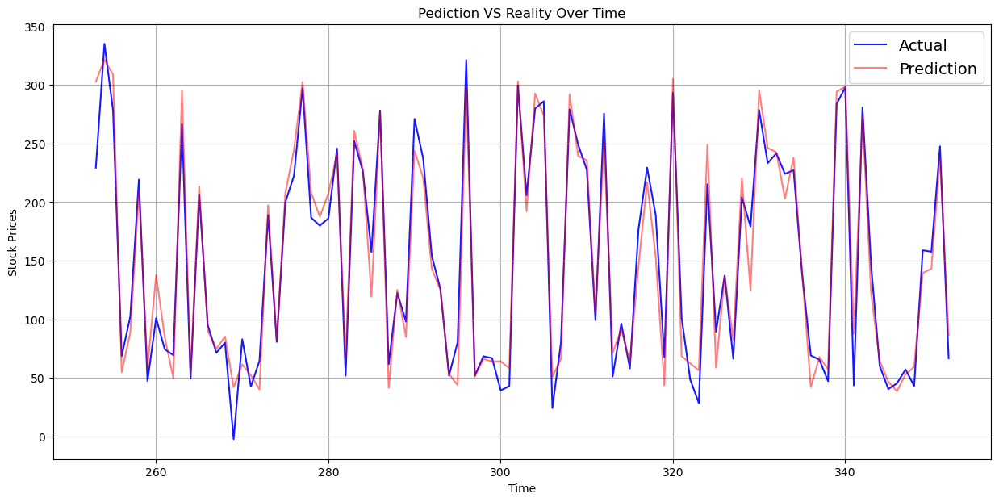

R² Score        : 0.9567
MAE (Error)     : 15.53
RMSE (Error)    : 19.62
Maximum Actual Price: 342.93
Maximum Predicted Price  : 335.84
Minimum Actual Price   : -2.48
Minimum Predicted Price  : 37.40
Ticker symbol : ADS
Security : Alliance Data Systems
SEC filings : reports
GICS Sector : Information Technology
GICS Sub Industry : Data Processing & Outsourced Services
Address of Headquarters : Plano, Texas
CIK : 1101215
Red - Predicted Stock Prices  ,  Blue - Actual Stock Prices


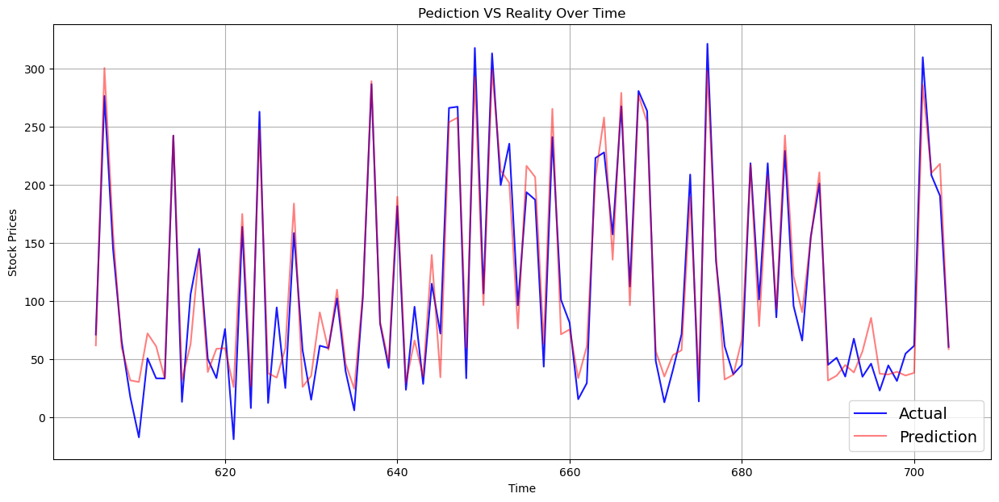

R² Score        : 0.9588
MAE (Error)     : 14.72
RMSE (Error)    : 18.26
Maximum Actual Price: 334.68
Maximum Predicted Price  : 308.23
Minimum Actual Price   : -19.25
Minimum Predicted Price  : 23.15
Ticker symbol : LNT
Security : Alliant Energy Corp
SEC filings : reports
GICS Sector : Utilities
GICS Sub Industry : Electric Utilities
Address of Headquarters : Madison, Wisconsin
CIK : 352541
Red - Predicted Stock Prices  ,  Blue - Actual Stock Prices


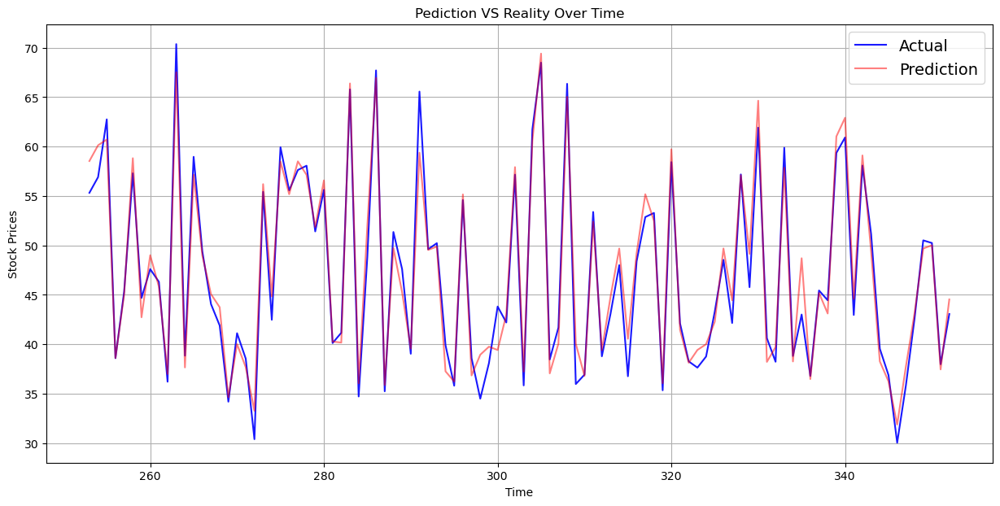

R² Score        : 0.9632
MAE (Error)     : 1.65
RMSE (Error)    : 2.07
Maximum Actual Price: 76.76
Maximum Predicted Price  : 73.65
Minimum Actual Price   : 28.53
Minimum Predicted Price  : 30.65
Ticker symbol : ALL
Security : Allstate Corp
SEC filings : reports
GICS Sector : Financials
GICS Sub Industry : Property & Casualty Insurance
Address of Headquarters : Northfield Township, Illinois
CIK : 899051
Red - Predicted Stock Prices  ,  Blue - Actual Stock Prices


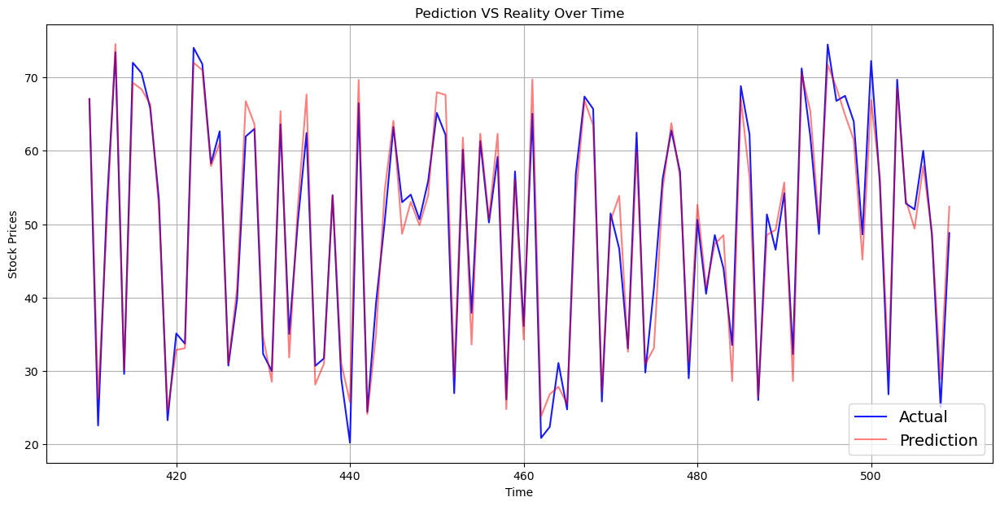

R² Score        : 0.9641
MAE (Error)     : 2.29
RMSE (Error)    : 2.87
Maximum Actual Price: 78.25
Maximum Predicted Price  : 74.59
Minimum Actual Price   : 20.03
Minimum Predicted Price  : 22.80
Ticker symbol : GOOGL
Security : Alphabet Inc Class A
SEC filings : reports
GICS Sector : Information Technology
GICS Sub Industry : Internet Software & Services
Address of Headquarters : Mountain View, California
CIK : 1652044
Red - Predicted Stock Prices  ,  Blue - Actual Stock Prices


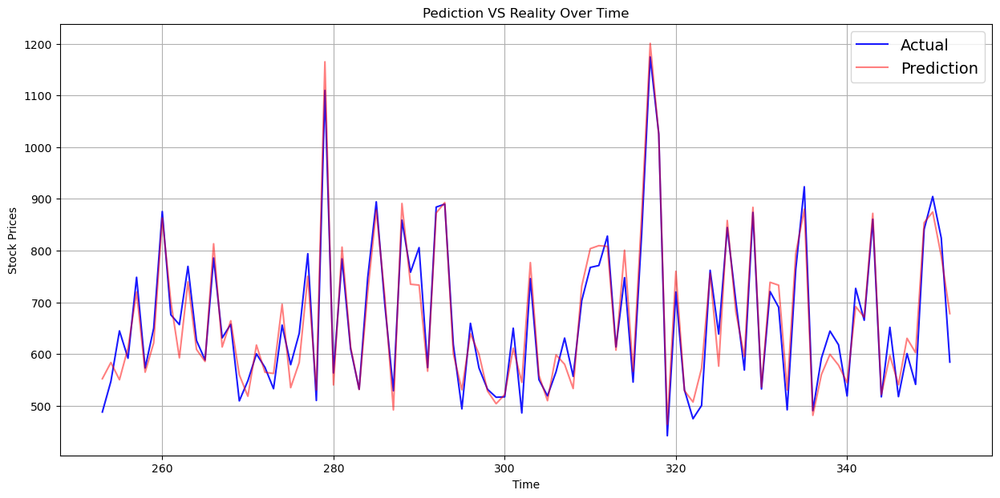

R² Score        : 0.9569
MAE (Error)     : 26.79
RMSE (Error)    : 33.37
Maximum Actual Price: 1251.95
Maximum Predicted Price  : 1222.59
Minimum Actual Price   : 395.67
Minimum Predicted Price  : 441.45
Ticker symbol : GOOG
Security : Alphabet Inc Class C
SEC filings : reports
GICS Sector : Information Technology
GICS Sub Industry : Internet Software & Services
Address of Headquarters : Mountain View, California
CIK : 1652044
Red - Predicted Stock Prices  ,  Blue - Actual Stock Prices


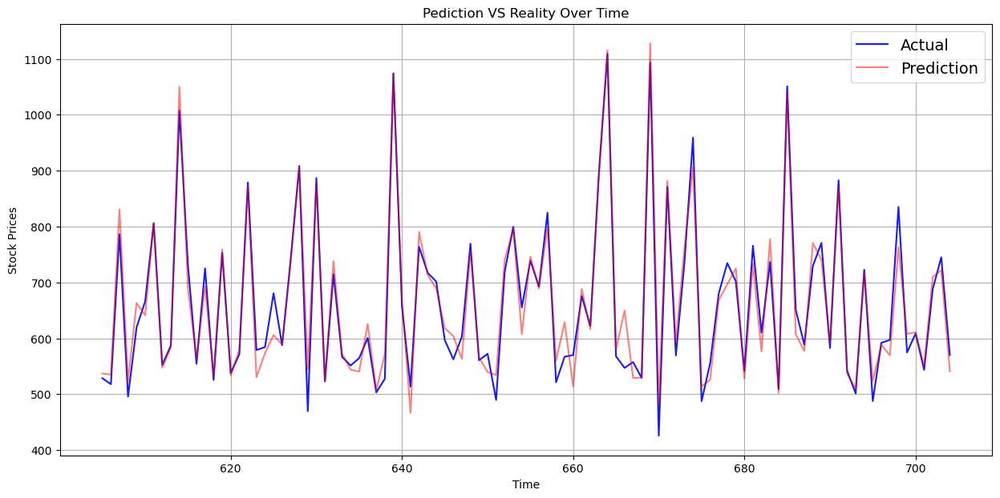

R² Score        : 0.9568
MAE (Error)     : 26.08
RMSE (Error)    : 33.13
Maximum Actual Price: 1241.23
Maximum Predicted Price  : 1211.50
Minimum Actual Price   : 378.48
Minimum Predicted Price  : 439.15
Ticker symbol : MO
Security : Altria Group Inc
SEC filings : reports
GICS Sector : Consumer Staples
GICS Sub Industry : Tobacco
Address of Headquarters : Richmond, Virginia
CIK : 764180
Red - Predicted Stock Prices  ,  Blue - Actual Stock Prices


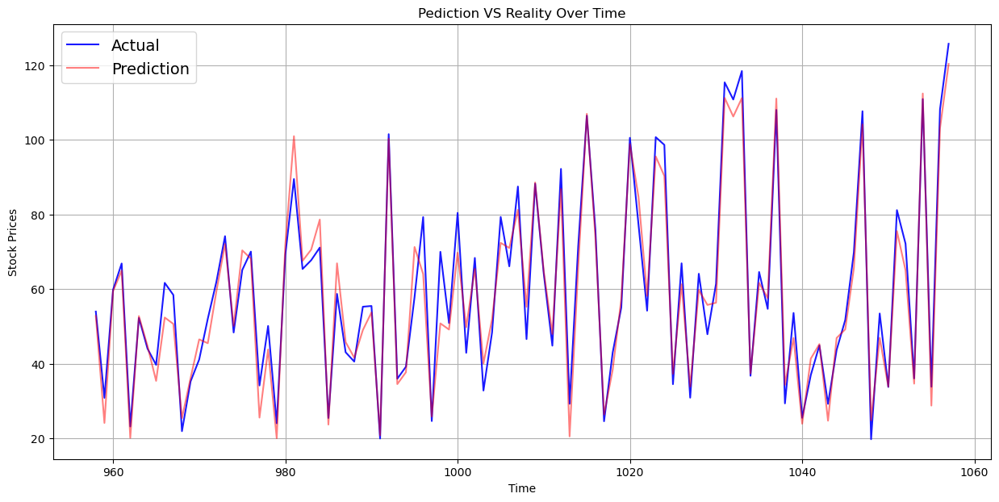

R² Score        : 0.9640
MAE (Error)     : 4.29
RMSE (Error)    : 5.40
Maximum Actual Price: 134.95
Maximum Predicted Price  : 126.96
Minimum Actual Price   : 10.37
Minimum Predicted Price  : 19.38
Ticker symbol : AMZN
Security : Amazon.com Inc
SEC filings : reports
GICS Sector : Consumer Discretionary
GICS Sub Industry : Internet & Direct Marketing Retail
Address of Headquarters : Seattle, Washington
CIK : 1018724
Red - Predicted Stock Prices  ,  Blue - Actual Stock Prices


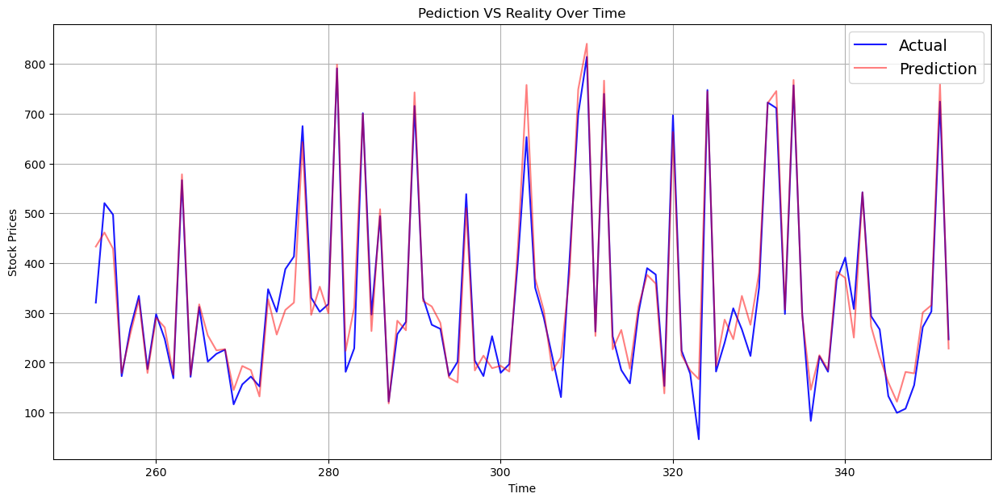

R² Score        : 0.9626
MAE (Error)     : 30.70
RMSE (Error)    : 38.66
Maximum Actual Price: 904.40
Maximum Predicted Price  : 840.29
Minimum Actual Price   : 45.14
Minimum Predicted Price  : 110.03
Ticker symbol : AEE
Security : Ameren Corp
SEC filings : reports
GICS Sector : Utilities
GICS Sub Industry : MultiUtilities
Address of Headquarters : St. Louis, Missouri
CIK : 1002910
Red - Predicted Stock Prices  ,  Blue - Actual Stock Prices


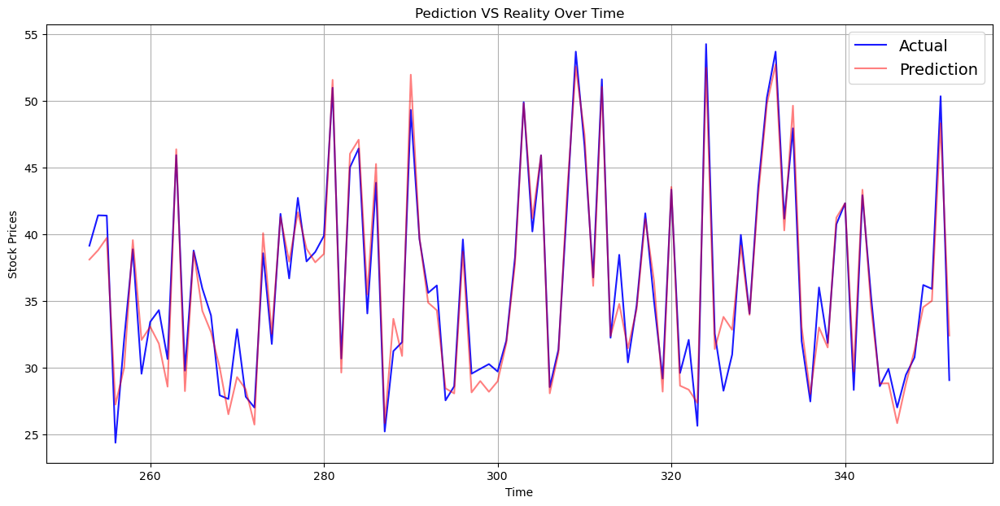

R² Score        : 0.9651
MAE (Error)     : 1.17
RMSE (Error)    : 1.45
Maximum Actual Price: 54.68
Maximum Predicted Price  : 53.61
Minimum Actual Price   : 22.86
Minimum Predicted Price  : 23.65
Ticker symbol : AAL
Security : American Airlines Group
SEC filings : reports
GICS Sector : Industrials
GICS Sub Industry : Airlines
Address of Headquarters : Fort Worth, Texas
CIK : 6201
Red - Predicted Stock Prices  ,  Blue - Actual Stock Prices


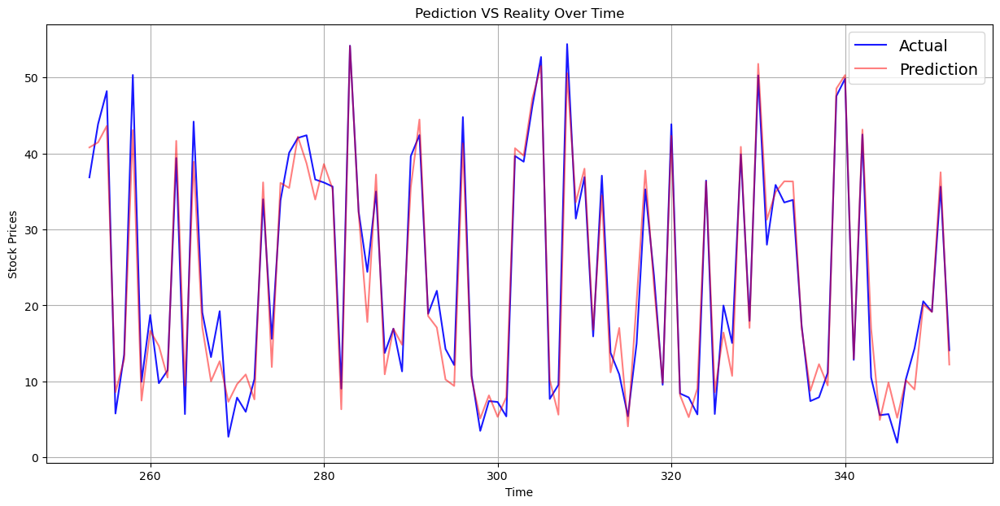

R² Score        : 0.9608
MAE (Error)     : 2.51
RMSE (Error)    : 3.13
Maximum Actual Price: 57.65
Maximum Predicted Price  : 54.91
Minimum Actual Price   : -1.24
Minimum Predicted Price  : 4.08
Ticker symbol : AEP
Security : American Electric Power
SEC filings : reports
GICS Sector : Utilities
GICS Sub Industry : Electric Utilities
Address of Headquarters : Columbus, Ohio
CIK : 4904
Red - Predicted Stock Prices  ,  Blue - Actual Stock Prices


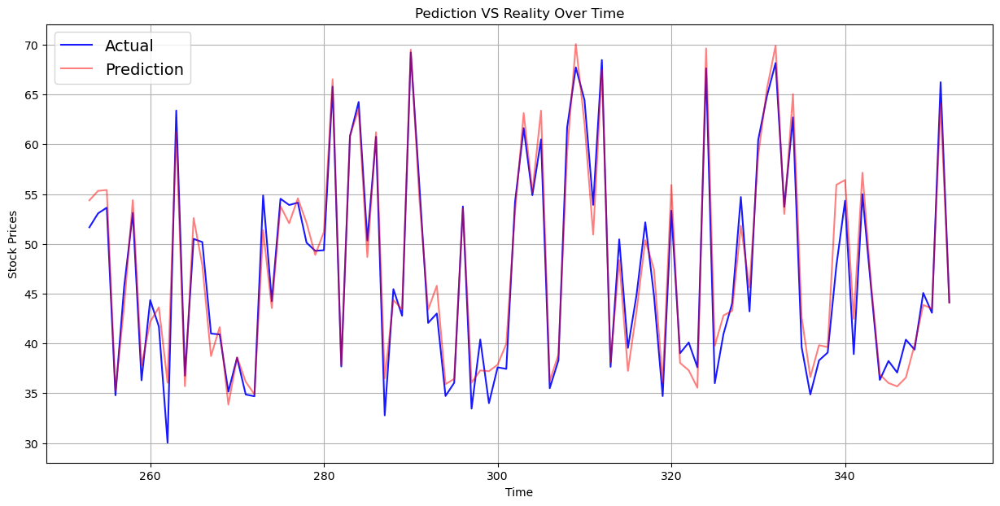

R² Score        : 0.9650
MAE (Error)     : 1.59
RMSE (Error)    : 2.01
Maximum Actual Price: 73.13
Maximum Predicted Price  : 70.85
Minimum Actual Price   : 29.50
Minimum Predicted Price  : 31.24
Ticker symbol : AXP
Security : American Express Co
SEC filings : reports
GICS Sector : Financials
GICS Sub Industry : Consumer Finance
Address of Headquarters : New York, New York
CIK : 4962
Red - Predicted Stock Prices  ,  Blue - Actual Stock Prices


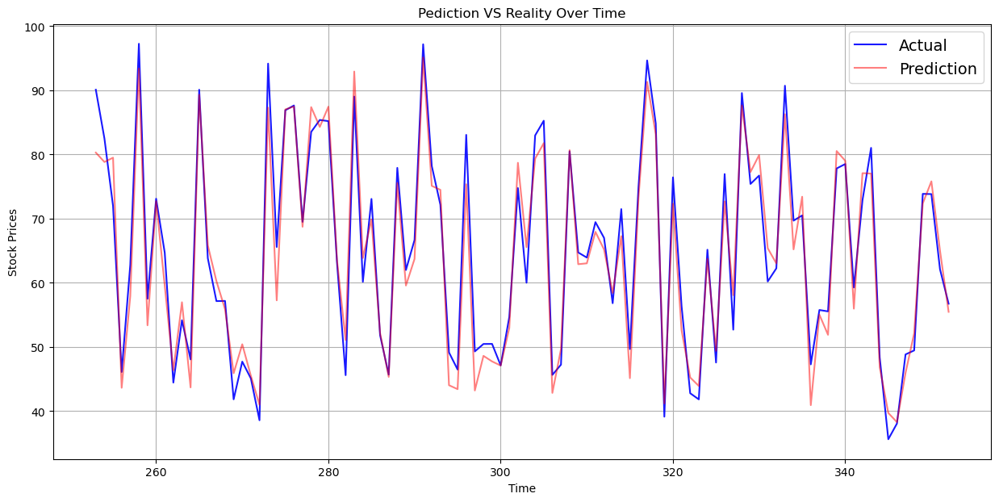

R² Score        : 0.9604
MAE (Error)     : 2.74
RMSE (Error)    : 3.35
Maximum Actual Price: 99.33
Maximum Predicted Price  : 95.41
Minimum Actual Price   : 32.88
Minimum Predicted Price  : 37.62
Ticker symbol : AIG
Security : American International Group, Inc.
SEC filings : reports
GICS Sector : Financials
GICS Sub Industry : Property & Casualty Insurance
Address of Headquarters : New York, New York
CIK : 5272
Red - Predicted Stock Prices  ,  Blue - Actual Stock Prices


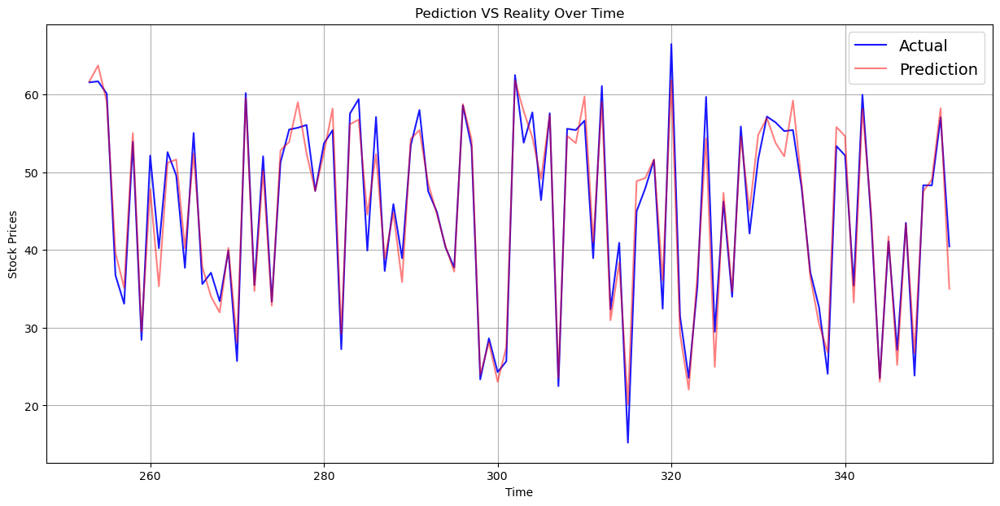

R² Score        : 0.9650
MAE (Error)     : 1.90
RMSE (Error)    : 2.37
Maximum Actual Price: 69.11
Maximum Predicted Price  : 66.39
Minimum Actual Price   : 15.21
Minimum Predicted Price  : 20.14
Ticker symbol : AMT
Security : American Tower Corp A
SEC filings : reports
GICS Sector : Real Estate
GICS Sub Industry : Specialized REITs
Address of Headquarters : Boston, Massachusetts
CIK : 1053507
Red - Predicted Stock Prices  ,  Blue - Actual Stock Prices


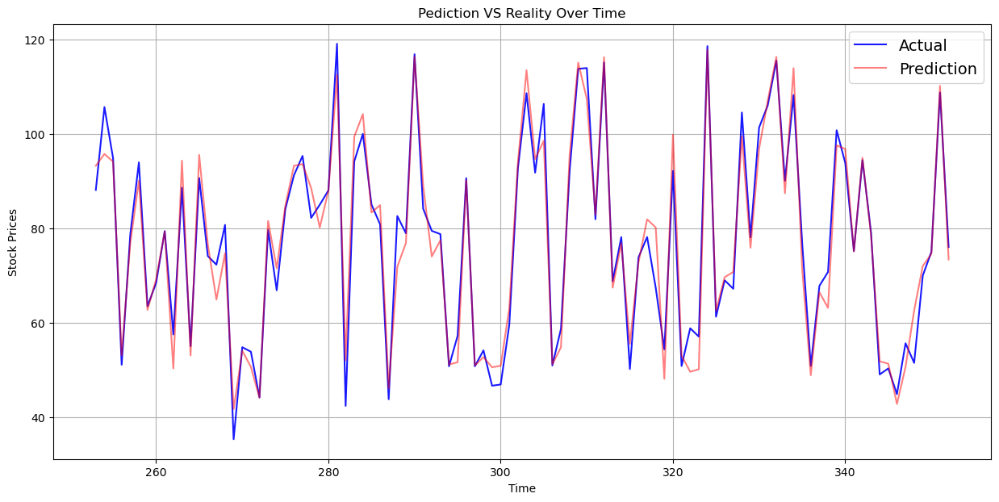

R² Score        : 0.9640
MAE (Error)     : 3.23
RMSE (Error)    : 4.13
Maximum Actual Price: 123.01
Maximum Predicted Price  : 117.91
Minimum Actual Price   : 35.26
Minimum Predicted Price  : 39.88
Ticker symbol : AWK
Security : American Water Works Company Inc
SEC filings : reports
GICS Sector : Utilities
GICS Sub Industry : Water Utilities
Address of Headquarters : Voorhees, New Jersey
CIK : 1410636
Red - Predicted Stock Prices  ,  Blue - Actual Stock Prices


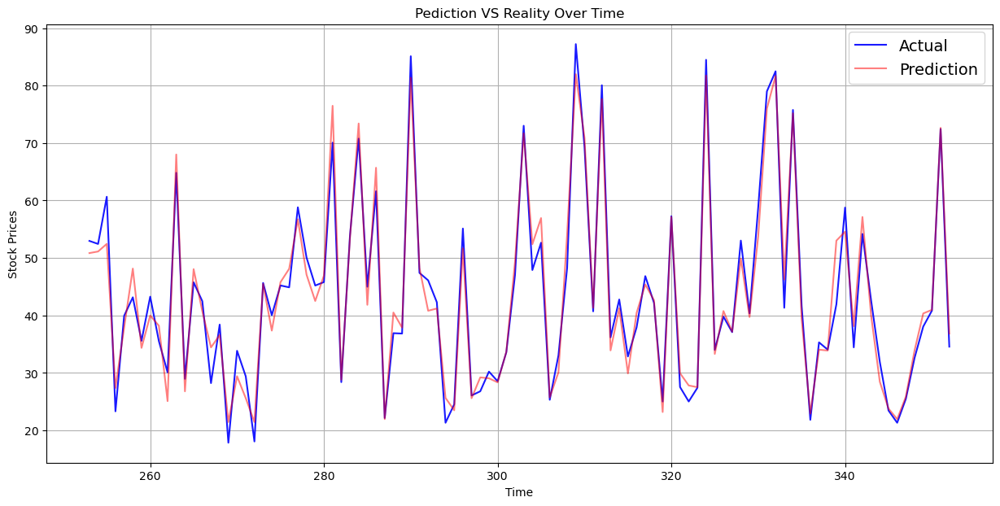

R² Score        : 0.9625
MAE (Error)     : 2.62
RMSE (Error)    : 3.31
Maximum Actual Price: 87.34
Maximum Predicted Price  : 83.59
Minimum Actual Price   : 15.84
Minimum Predicted Price  : 20.26
Ticker symbol : AMP
Security : Ameriprise Financial
SEC filings : reports
GICS Sector : Financials
GICS Sub Industry : Asset Management & Custody Banks
Address of Headquarters : Minneapolis, Minnesota
CIK : 820027
Red - Predicted Stock Prices  ,  Blue - Actual Stock Prices


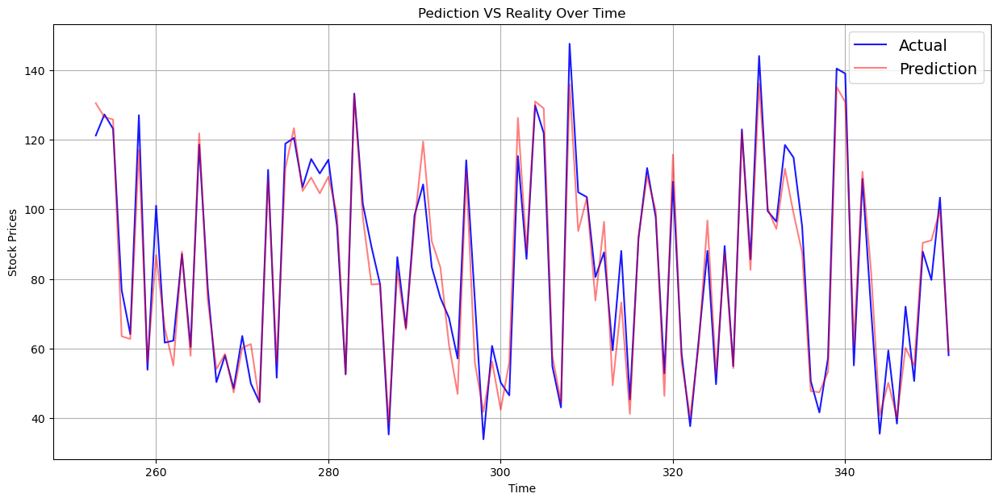

R² Score        : 0.9572
MAE (Error)     : 5.14
RMSE (Error)    : 6.46
Maximum Actual Price: 147.53
Maximum Predicted Price  : 136.08
Minimum Actual Price   : 18.43
Minimum Predicted Price  : 35.45
Ticker symbol : ABC
Security : AmerisourceBergen Corp
SEC filings : reports
GICS Sector : Health Care
GICS Sub Industry : Health Care Distributors
Address of Headquarters : Chesterbrook, Pennsylvania
CIK : 1140859
Red - Predicted Stock Prices  ,  Blue - Actual Stock Prices


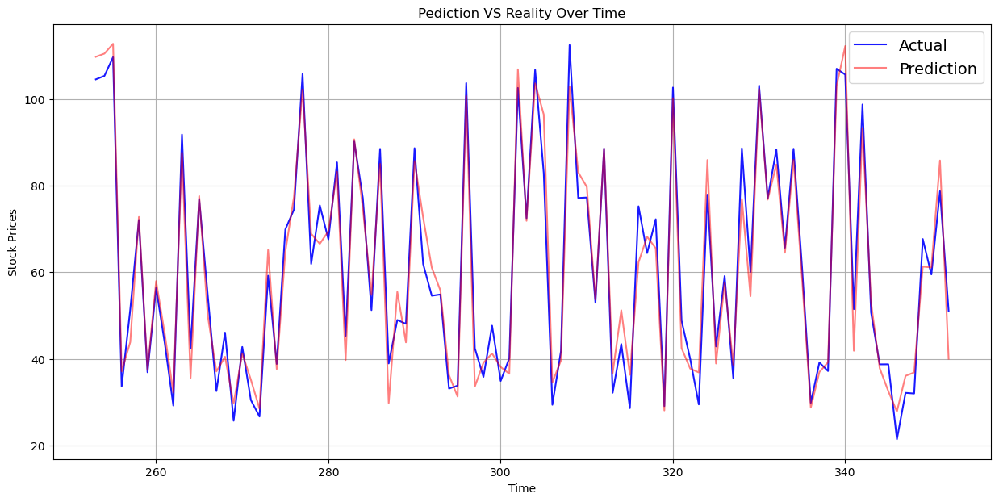

R² Score        : 0.9638
MAE (Error)     : 4.03
RMSE (Error)    : 5.05
Maximum Actual Price: 120.52
Maximum Predicted Price  : 114.78
Minimum Actual Price   : 21.40
Minimum Predicted Price  : 27.21
Ticker symbol : AME
Security : AMETEK Inc
SEC filings : reports
GICS Sector : Industrials
GICS Sub Industry : Electrical Components & Equipment
Address of Headquarters : Berwyn, Pennsylvania
CIK : 1037868
Red - Predicted Stock Prices  ,  Blue - Actual Stock Prices


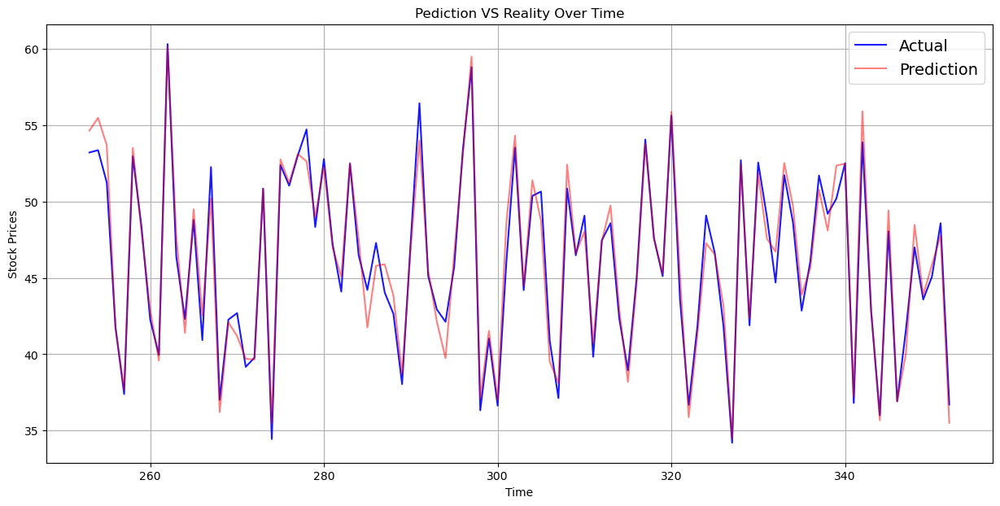

R² Score        : 0.9575
MAE (Error)     : 0.97
RMSE (Error)    : 1.23
Maximum Actual Price: 60.96
Maximum Predicted Price  : 60.31
Minimum Actual Price   : 31.81
Minimum Predicted Price  : 30.51
Ticker symbol : AMGN
Security : Amgen Inc
SEC filings : reports
GICS Sector : Health Care
GICS Sub Industry : Biotechnology
Address of Headquarters : Thousand Oaks, California
CIK : 318154
Red - Predicted Stock Prices  ,  Blue - Actual Stock Prices


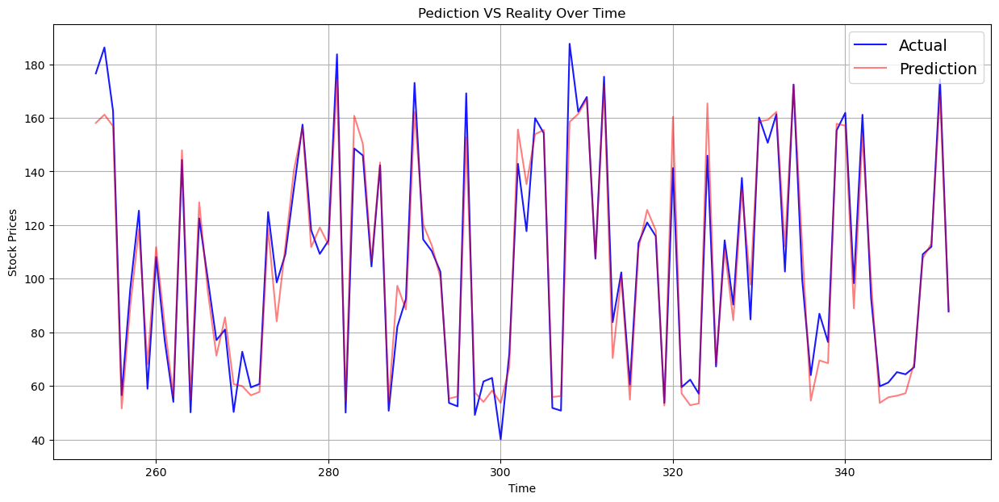

R² Score        : 0.9594
MAE (Error)     : 6.94
RMSE (Error)    : 8.73
Maximum Actual Price: 187.61
Maximum Predicted Price  : 176.49
Minimum Actual Price   : 34.52
Minimum Predicted Price  : 51.31
Ticker symbol : APH
Security : Amphenol Corp
SEC filings : reports
GICS Sector : Information Technology
GICS Sub Industry : Electronic Components
Address of Headquarters : Wallingford, Connecticut
CIK : 820313
Red - Predicted Stock Prices  ,  Blue - Actual Stock Prices


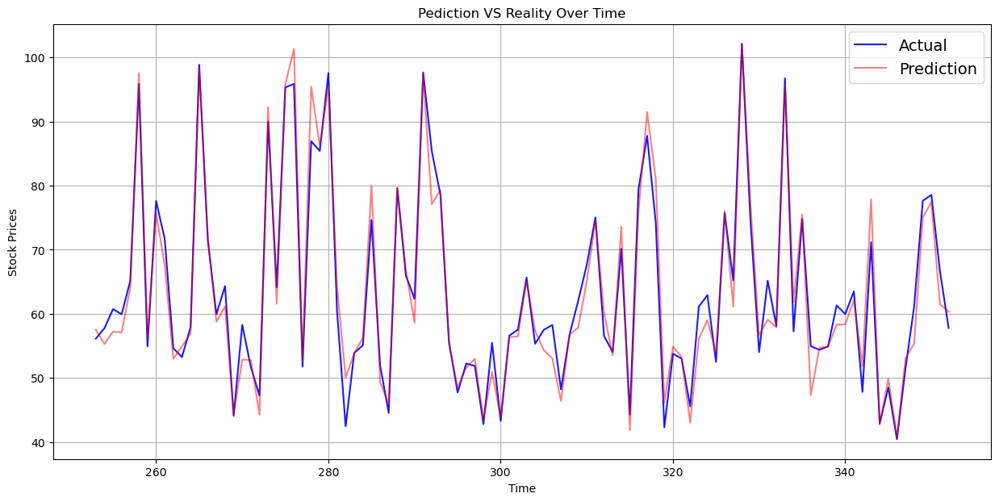

R² Score        : 0.9627
MAE (Error)     : 2.45
RMSE (Error)    : 3.11
Maximum Actual Price: 108.37
Maximum Predicted Price  : 104.69
Minimum Actual Price   : 37.02
Minimum Predicted Price  : 38.42
Ticker symbol : APC
Security : Anadarko Petroleum Corp
SEC filings : reports
GICS Sector : Energy
GICS Sub Industry : Oil & Gas Exploration & Production
Address of Headquarters : The Woodlands, Texas
CIK : 773910
Red - Predicted Stock Prices  ,  Blue - Actual Stock Prices


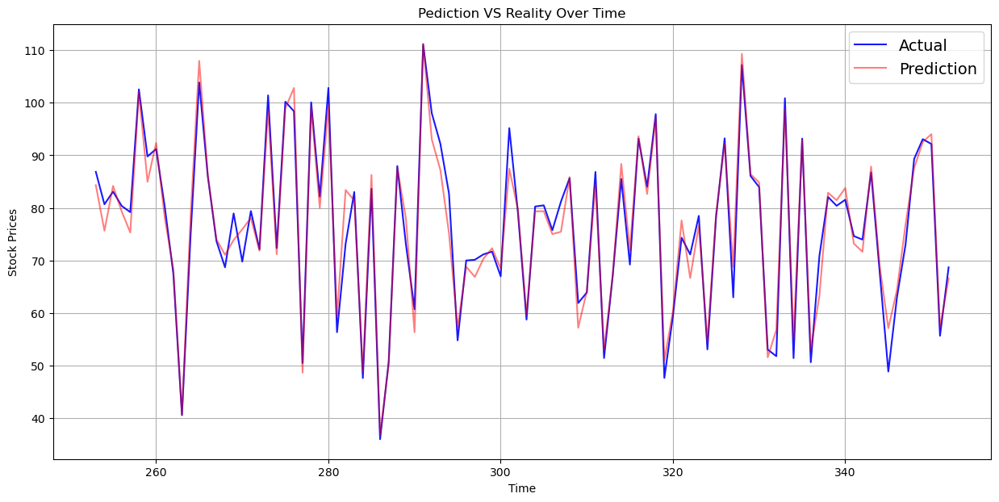

R² Score        : 0.9654
MAE (Error)     : 2.40
RMSE (Error)    : 3.02
Maximum Actual Price: 113.68
Maximum Predicted Price  : 112.10
Minimum Actual Price   : 33.48
Minimum Predicted Price  : 34.69
Ticker symbol : ADI
Security : Analog Devices, Inc.
SEC filings : reports
GICS Sector : Information Technology
GICS Sub Industry : Semiconductors
Address of Headquarters : Norwood, Massachusetts
CIK : 6281
Red - Predicted Stock Prices  ,  Blue - Actual Stock Prices


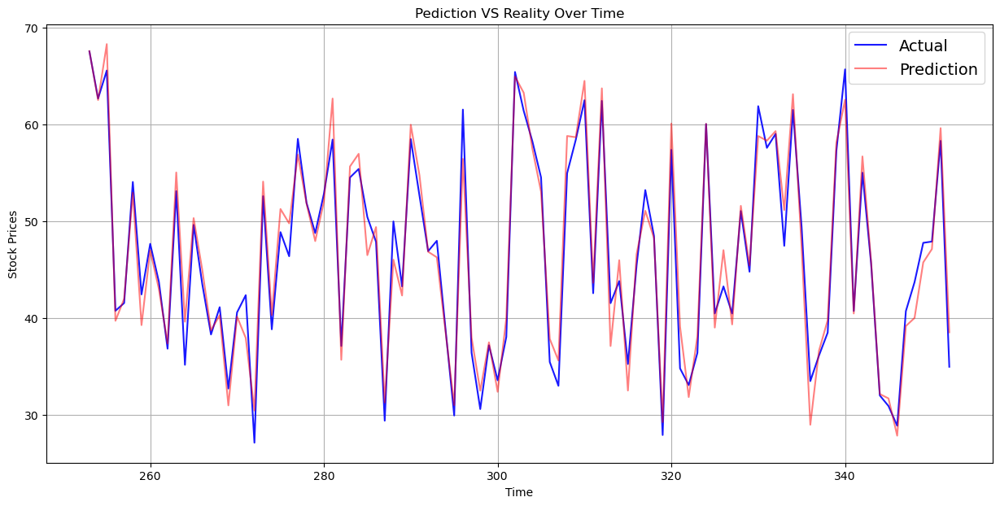

R² Score        : 0.9643
MAE (Error)     : 1.71
RMSE (Error)    : 2.15
Maximum Actual Price: 77.99
Maximum Predicted Price  : 74.18
Minimum Actual Price   : 25.74
Minimum Predicted Price  : 26.70
Ticker symbol : ANTM
Security : Anthem Inc.
SEC filings : reports
GICS Sector : Health Care
GICS Sub Industry : Managed Health Care
Address of Headquarters : Indianapolis, Indiana
CIK : 1156039
Red - Predicted Stock Prices  ,  Blue - Actual Stock Prices


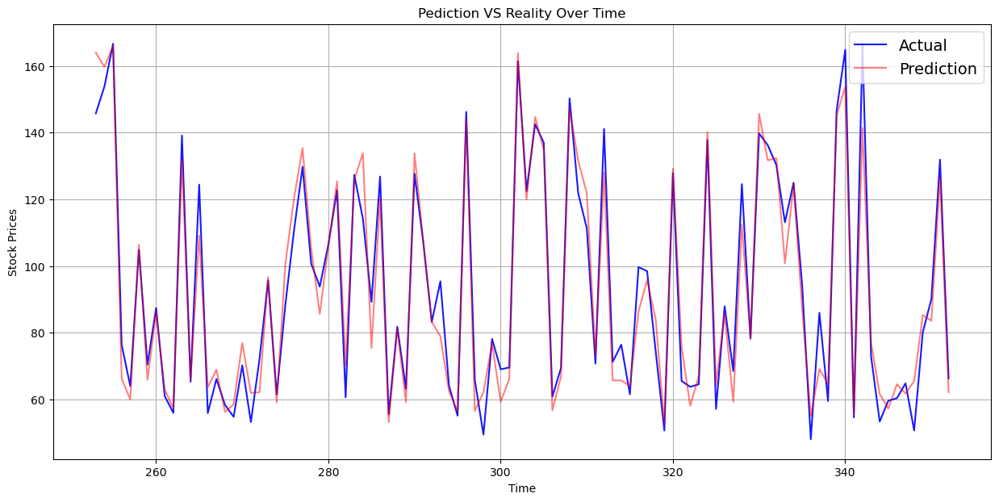

R² Score        : 0.9495
MAE (Error)     : 6.28
RMSE (Error)    : 7.83
Maximum Actual Price: 175.85
Maximum Predicted Price  : 168.14
Minimum Actual Price   : 45.32
Minimum Predicted Price  : 47.97
Ticker symbol : AON
Security : Aon plc
SEC filings : reports
GICS Sector : Financials
GICS Sub Industry : Insurance Brokers
Address of Headquarters : London, United Kingdom
CIK : 315293
Red - Predicted Stock Prices  ,  Blue - Actual Stock Prices


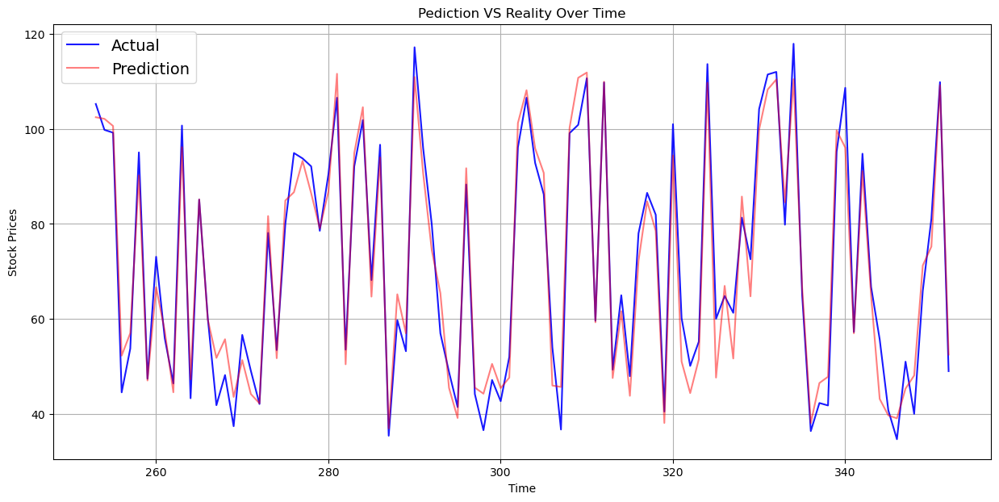

R² Score        : 0.9635
MAE (Error)     : 3.92
RMSE (Error)    : 4.83
Maximum Actual Price: 119.10
Maximum Predicted Price  : 113.13
Minimum Actual Price   : 29.78
Minimum Predicted Price  : 36.20
Ticker symbol : APA
Security : Apache Corporation
SEC filings : reports
GICS Sector : Energy
GICS Sub Industry : Oil & Gas Exploration & Production
Address of Headquarters : Houston, Texas
CIK : 6769
Red - Predicted Stock Prices  ,  Blue - Actual Stock Prices


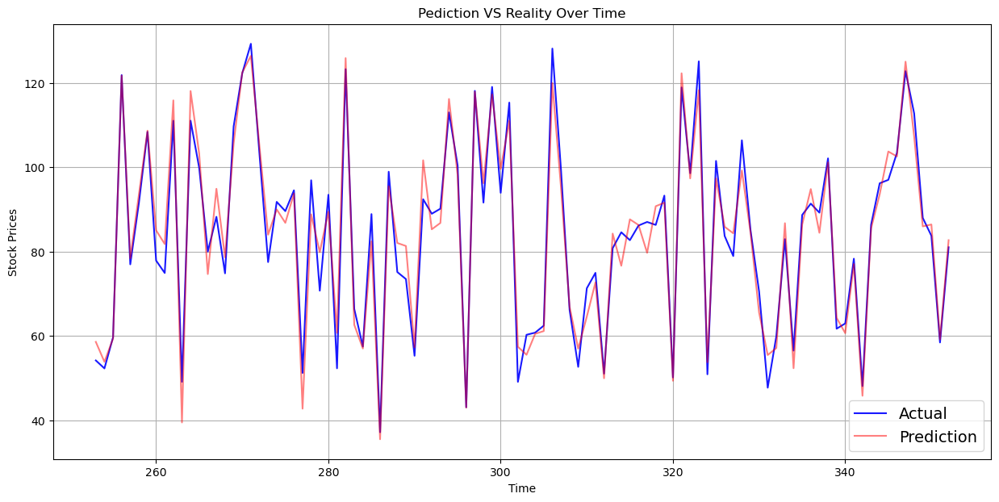

R² Score        : 0.9620
MAE (Error)     : 3.67
RMSE (Error)    : 4.52
Maximum Actual Price: 134.20
Maximum Predicted Price  : 130.60
Minimum Actual Price   : 31.74
Minimum Predicted Price  : 35.52
Ticker symbol : AIV
Security : Apartment Investment & Mgmt
SEC filings : reports
GICS Sector : Real Estate
GICS Sub Industry : REITs
Address of Headquarters : Denver, Colorado
CIK : 922864
Red - Predicted Stock Prices  ,  Blue - Actual Stock Prices


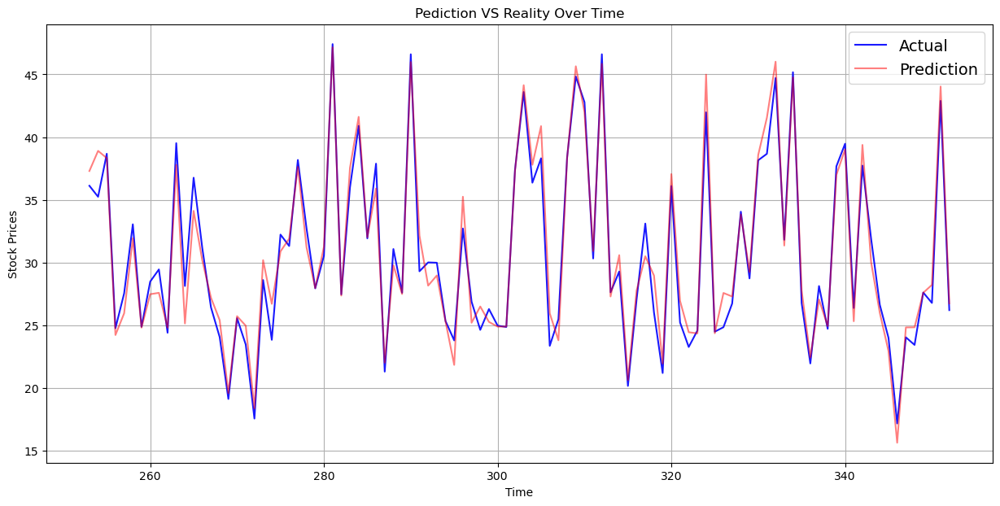

R² Score        : 0.9590
MAE (Error)     : 1.19
RMSE (Error)    : 1.51
Maximum Actual Price: 47.41
Maximum Predicted Price  : 47.64
Minimum Actual Price   : 15.97
Minimum Predicted Price  : 15.50
Ticker symbol : AAPL
Security : Apple Inc.
SEC filings : reports
GICS Sector : Information Technology
GICS Sub Industry : Computer Hardware
Address of Headquarters : Cupertino, California
CIK : 320193
Red - Predicted Stock Prices  ,  Blue - Actual Stock Prices


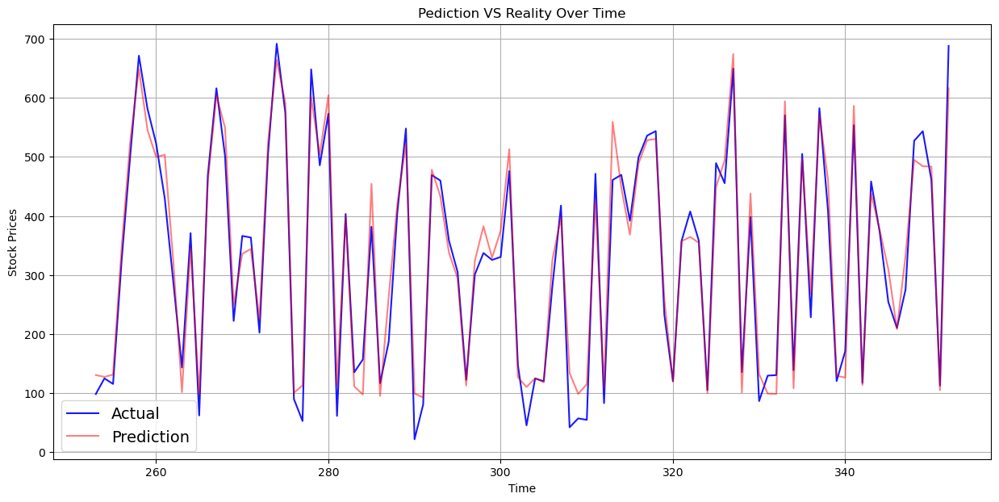

R² Score        : 0.9657
MAE (Error)     : 28.43
RMSE (Error)    : 35.71
Maximum Actual Price: 697.00
Maximum Predicted Price  : 679.40
Minimum Actual Price   : 15.54
Minimum Predicted Price  : 91.86
Ticker symbol : AMAT
Security : Applied Materials Inc
SEC filings : reports
GICS Sector : Information Technology
GICS Sub Industry : Semiconductor Equipment
Address of Headquarters : Santa Clara, California
CIK : 6951
Red - Predicted Stock Prices  ,  Blue - Actual Stock Prices


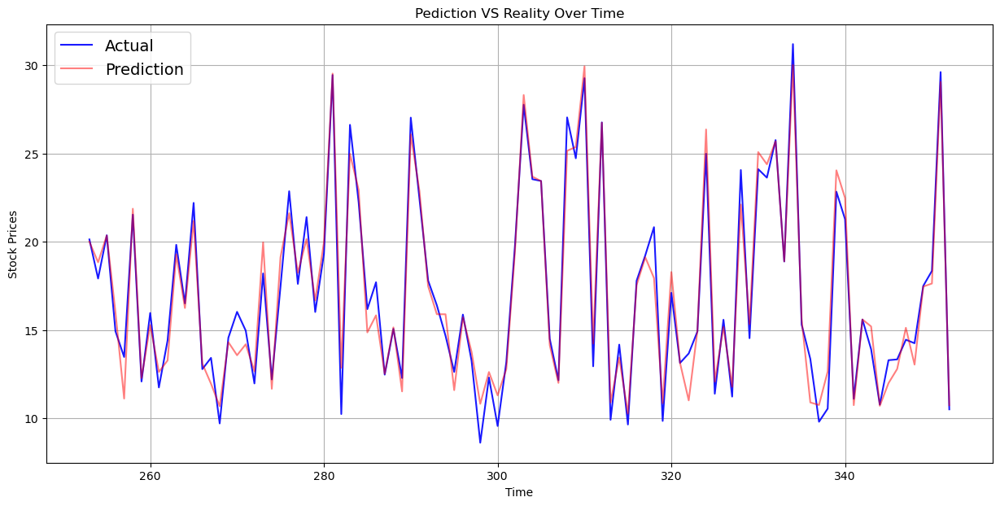

R² Score        : 0.9645
MAE (Error)     : 0.86
RMSE (Error)    : 1.08
Maximum Actual Price: 33.59
Maximum Predicted Price  : 33.25
Minimum Actual Price   : 8.63
Minimum Predicted Price  : 10.08
Ticker symbol : ADM
Security : Archer-Daniels-Midland Co
SEC filings : reports
GICS Sector : Consumer Staples
GICS Sub Industry : Agricultural Products
Address of Headquarters : Decatur, Illinois
CIK : 7084
Red - Predicted Stock Prices  ,  Blue - Actual Stock Prices


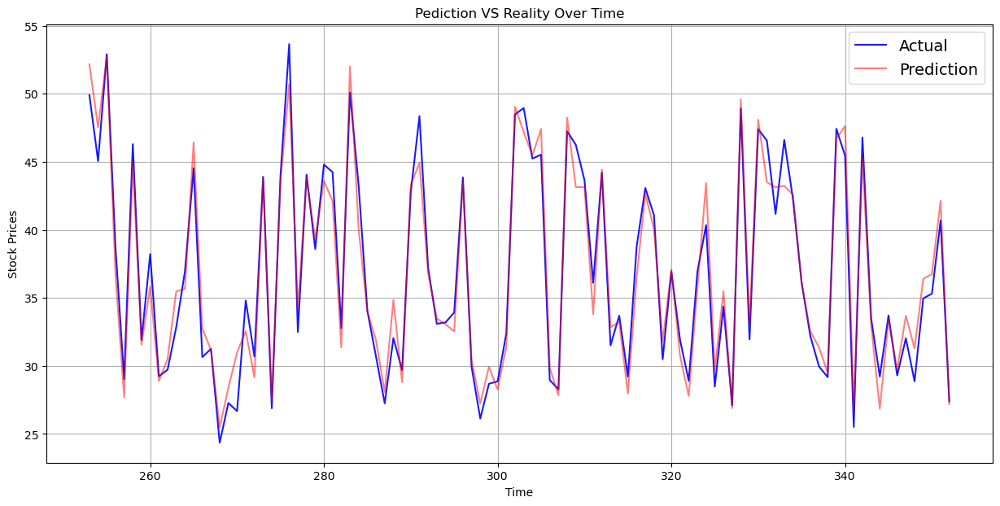

R² Score        : 0.9624
MAE (Error)     : 1.25
RMSE (Error)    : 1.57
Maximum Actual Price: 55.01
Maximum Predicted Price  : 53.07
Minimum Actual Price   : 22.39
Minimum Predicted Price  : 25.02
Ticker symbol : ARNC
Security : Arconic Inc
SEC filings : reports
GICS Sector : Industrials
GICS Sub Industry : Aerospace & Defense
Address of Headquarters : New York, New York
CIK : 4281
Red - Predicted Stock Prices  ,  Blue - Actual Stock Prices


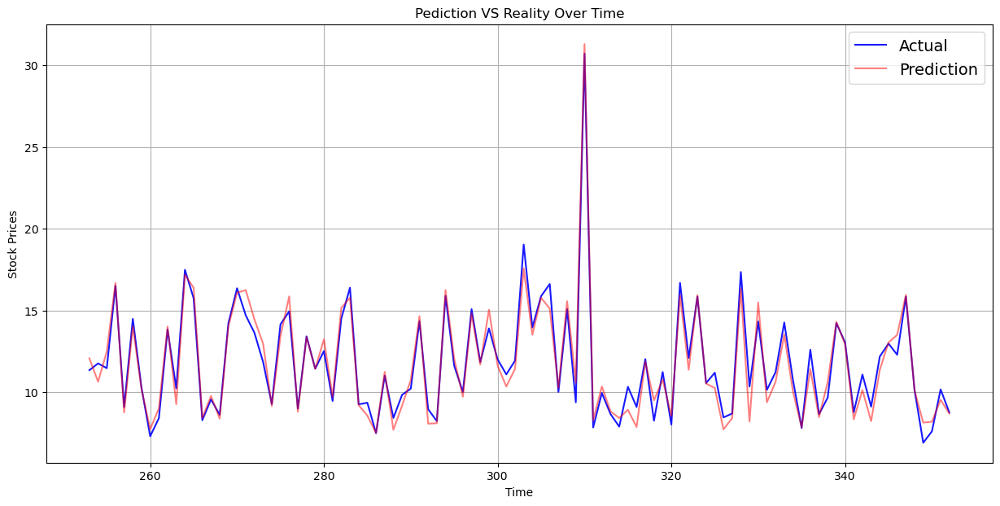

R² Score        : 0.9563
MAE (Error)     : 0.59
RMSE (Error)    : 0.75
Maximum Actual Price: 31.93
Maximum Predicted Price  : 31.62
Minimum Actual Price   : 6.63
Minimum Predicted Price  : 7.06
Ticker symbol : AJG
Security : Arthur J. Gallagher & Co.
SEC filings : reports
GICS Sector : Financials
GICS Sub Industry : Insurance Brokers
Address of Headquarters : Itasca, Illinois
CIK : 354190
Red - Predicted Stock Prices  ,  Blue - Actual Stock Prices


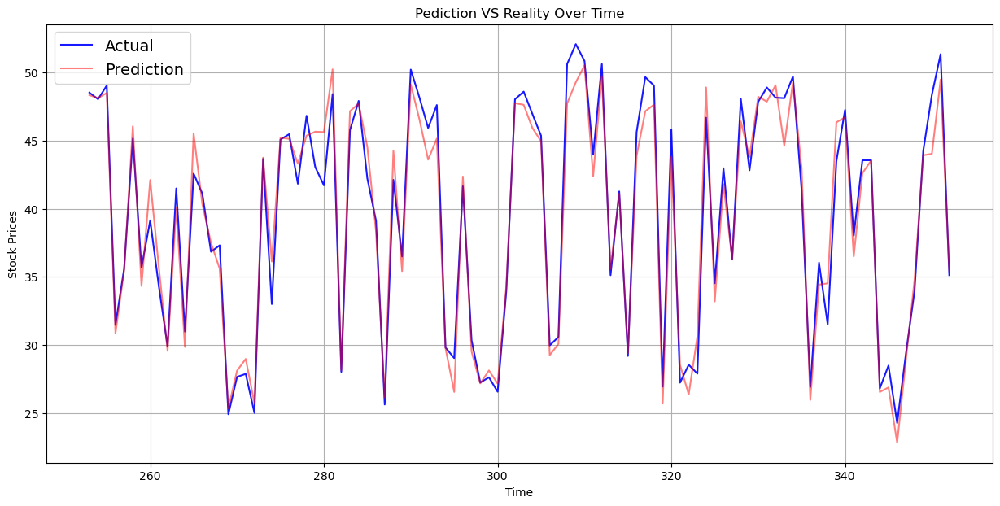

R² Score        : 0.9622
MAE (Error)     : 1.37
RMSE (Error)    : 1.70
Maximum Actual Price: 56.36
Maximum Predicted Price  : 51.93
Minimum Actual Price   : 20.32
Minimum Predicted Price  : 22.85
Ticker symbol : AIZ
Security : Assurant Inc
SEC filings : reports
GICS Sector : Financials
GICS Sub Industry : Multi-line Insurance
Address of Headquarters : New York, New York
CIK : 1267238
Red - Predicted Stock Prices  ,  Blue - Actual Stock Prices


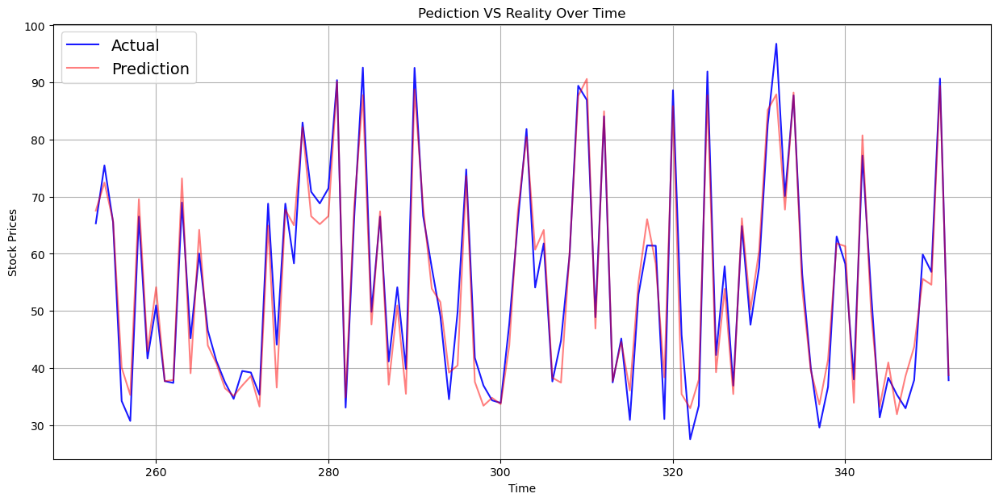

R² Score        : 0.9602
MAE (Error)     : 3.06
RMSE (Error)    : 3.84
Maximum Actual Price: 97.38
Maximum Predicted Price  : 93.24
Minimum Actual Price   : 27.53
Minimum Predicted Price  : 30.32
Ticker symbol : T
Security : AT&T Inc
SEC filings : reports
GICS Sector : Telecommunications Services
GICS Sub Industry : Integrated Telecommunications Services
Address of Headquarters : Dallas, Texas
CIK : 732717
Red - Predicted Stock Prices  ,  Blue - Actual Stock Prices


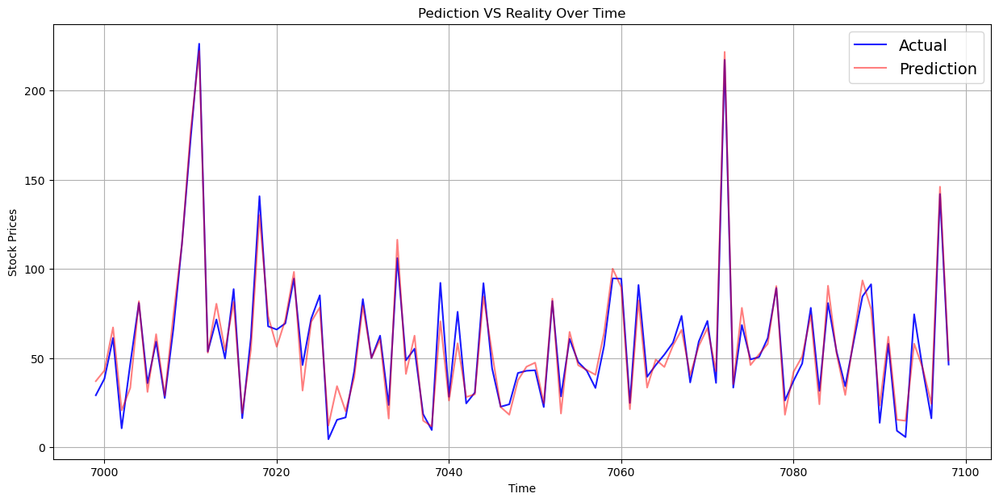

R² Score        : 0.9623
MAE (Error)     : 5.74
RMSE (Error)    : 7.23
Maximum Actual Price: 300.63
Maximum Predicted Price  : 289.43
Minimum Actual Price   : -7.49
Minimum Predicted Price  : 9.27
Ticker symbol : ADSK
Security : Autodesk Inc
SEC filings : reports
GICS Sector : Information Technology
GICS Sub Industry : Application Software
Address of Headquarters : San Rafael, California
CIK : 769397
Red - Predicted Stock Prices  ,  Blue - Actual Stock Prices


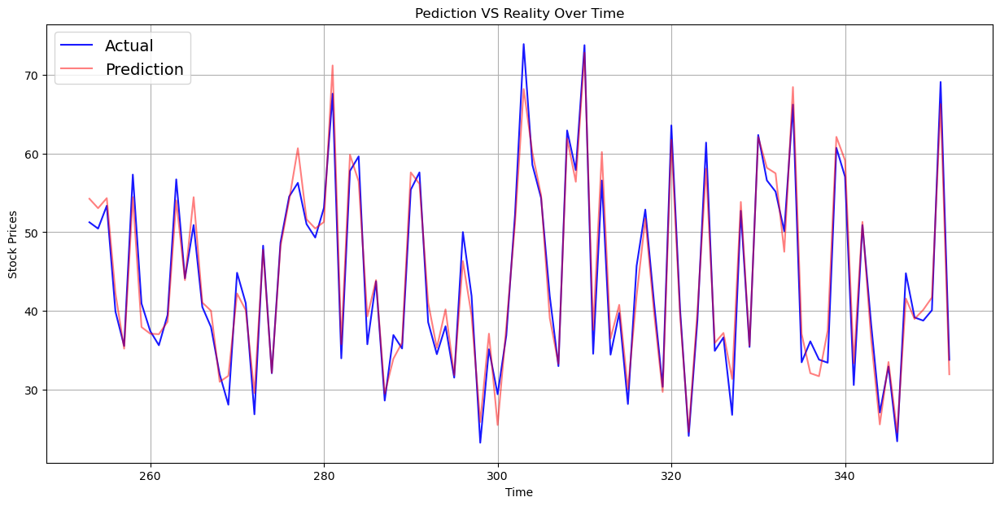

R² Score        : 0.9604
MAE (Error)     : 2.06
RMSE (Error)    : 2.57
Maximum Actual Price: 80.00
Maximum Predicted Price  : 80.14
Minimum Actual Price   : 21.04
Minimum Predicted Price  : 22.98
Ticker symbol : ADP
Security : Automatic Data Processing
SEC filings : reports
GICS Sector : Information Technology
GICS Sub Industry : Internet Software & Services
Address of Headquarters : Roseland, New Jersey
CIK : 8670
Red - Predicted Stock Prices  ,  Blue - Actual Stock Prices


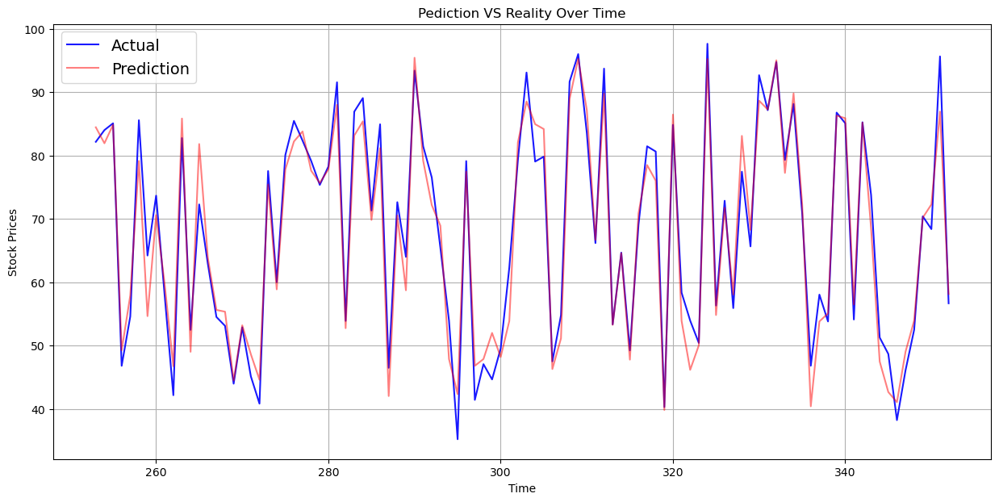

R² Score        : 0.9612
MAE (Error)     : 2.77
RMSE (Error)    : 3.52
Maximum Actual Price: 102.94
Maximum Predicted Price  : 103.27
Minimum Actual Price   : 31.74
Minimum Predicted Price  : 38.69
Ticker symbol : AN
Security : AutoNation Inc
SEC filings : reports
GICS Sector : Consumer Discretionary
GICS Sub Industry : Specialty Stores
Address of Headquarters : Fort Lauderdale, Florida
CIK : 350698
Red - Predicted Stock Prices  ,  Blue - Actual Stock Prices


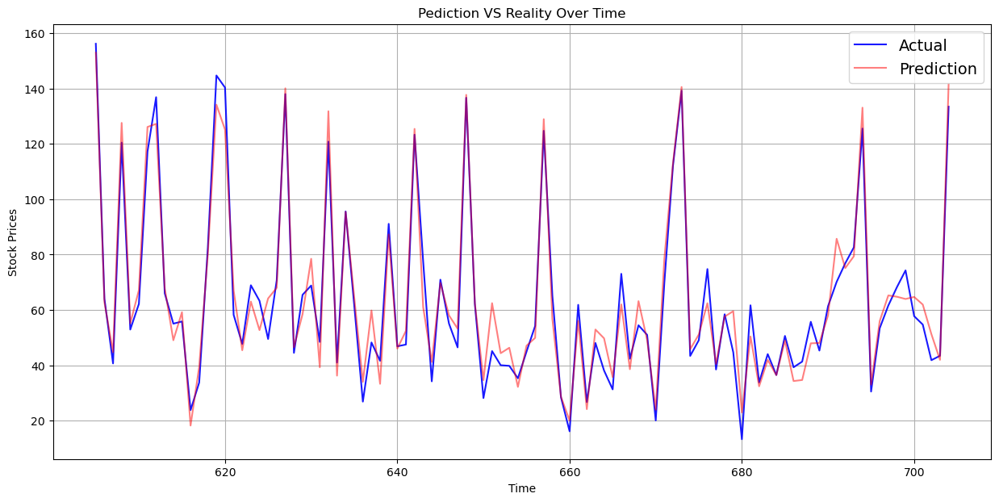

R² Score        : 0.9618
MAE (Error)     : 5.69
RMSE (Error)    : 7.13
Maximum Actual Price: 177.43
Maximum Predicted Price  : 170.58
Minimum Actual Price   : 4.97
Minimum Predicted Price  : 17.70
Ticker symbol : AZO
Security : AutoZone Inc
SEC filings : reports
GICS Sector : Consumer Discretionary
GICS Sub Industry : Specialty Stores
Address of Headquarters : Memphis, Tennessee
CIK : 866787
Red - Predicted Stock Prices  ,  Blue - Actual Stock Prices


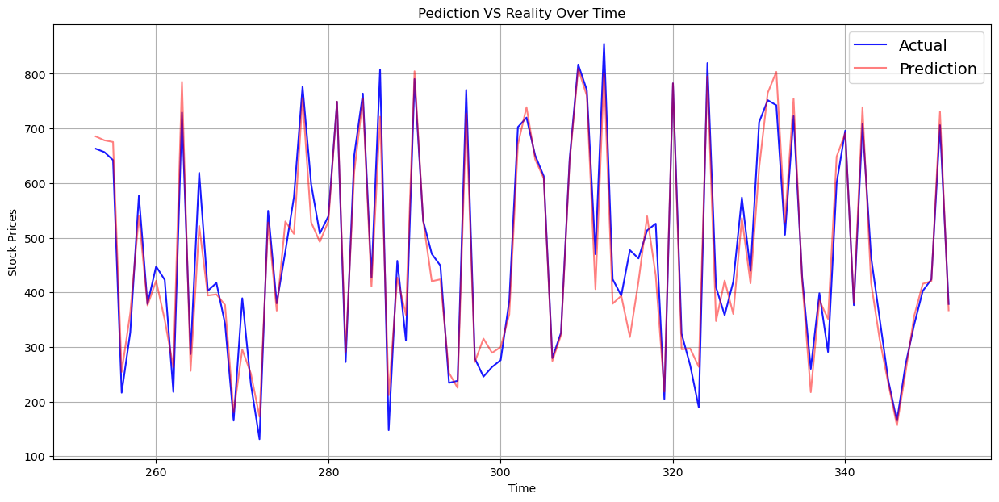

R² Score        : 0.9578
MAE (Error)     : 32.20
RMSE (Error)    : 41.40
Maximum Actual Price: 884.49
Maximum Predicted Price  : 814.93
Minimum Actual Price   : 130.61
Minimum Predicted Price  : 154.35
Ticker symbol : AVB
Security : AvalonBay Communities, Inc.
SEC filings : reports
GICS Sector : Real Estate
GICS Sub Industry : Residential REITs
Address of Headquarters : Arlington, Virginia[3]
CIK : 915912
Red - Predicted Stock Prices  ,  Blue - Actual Stock Prices


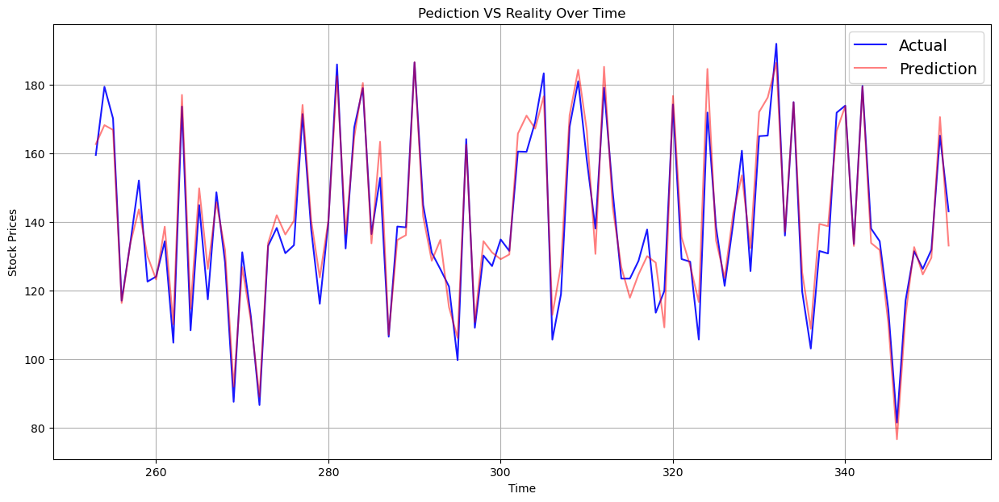

R² Score        : 0.9537
MAE (Error)     : 4.77
RMSE (Error)    : 5.77
Maximum Actual Price: 195.04
Maximum Predicted Price  : 189.29
Minimum Actual Price   : 68.25
Minimum Predicted Price  : 74.71
Ticker symbol : AVY
Security : Avery Dennison Corp
SEC filings : reports
GICS Sector : Materials
GICS Sub Industry : Paper Packaging
Address of Headquarters : Glendale, California
CIK : 8818
Red - Predicted Stock Prices  ,  Blue - Actual Stock Prices


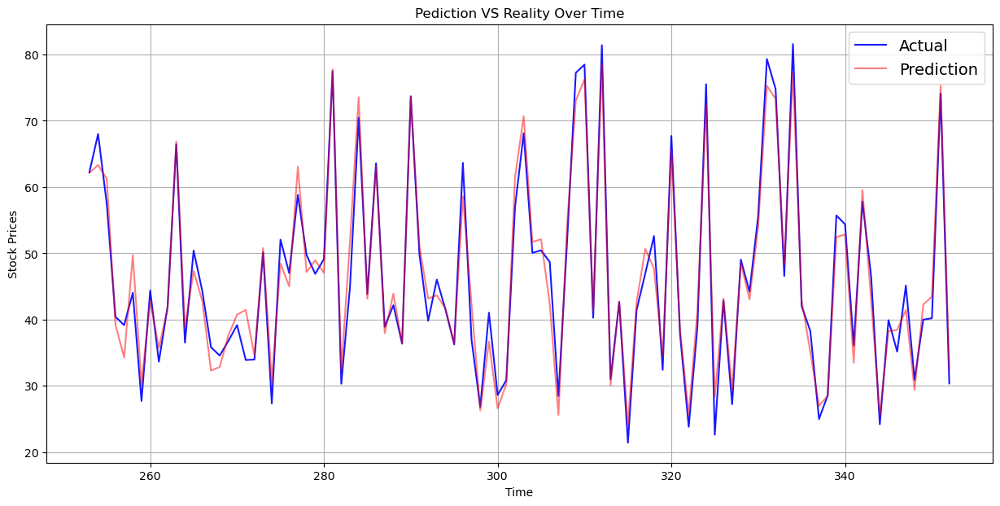

R² Score        : 0.9621
MAE (Error)     : 2.43
RMSE (Error)    : 2.94
Maximum Actual Price: 84.69
Maximum Predicted Price  : 78.61
Minimum Actual Price   : 21.42
Minimum Predicted Price  : 24.15
Ticker symbol : BHI
Security : Baker Hughes Inc
SEC filings : reports
GICS Sector : Energy
GICS Sub Industry : Oil & Gas Equipment & Services
Address of Headquarters : Houston, Texas
CIK : 808362
Red - Predicted Stock Prices  ,  Blue - Actual Stock Prices


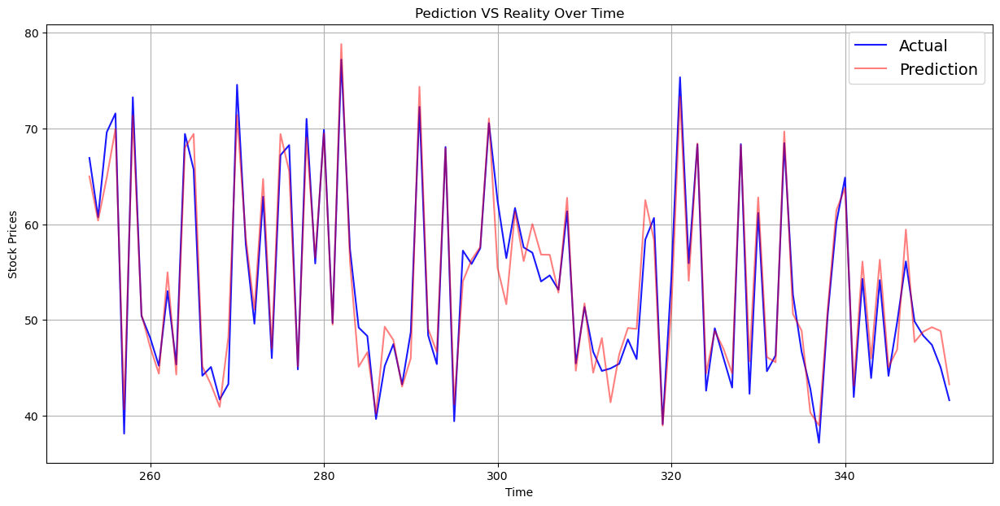

R² Score        : 0.9580
MAE (Error)     : 1.66
RMSE (Error)    : 2.08
Maximum Actual Price: 78.27
Maximum Predicted Price  : 78.82
Minimum Actual Price   : 36.87
Minimum Predicted Price  : 38.50
Ticker symbol : BLL
Security : Ball Corp
SEC filings : reports
GICS Sector : Materials
GICS Sub Industry : Metal & Glass Containers
Address of Headquarters : Broomfield, Colorado
CIK : 9389
Red - Predicted Stock Prices  ,  Blue - Actual Stock Prices


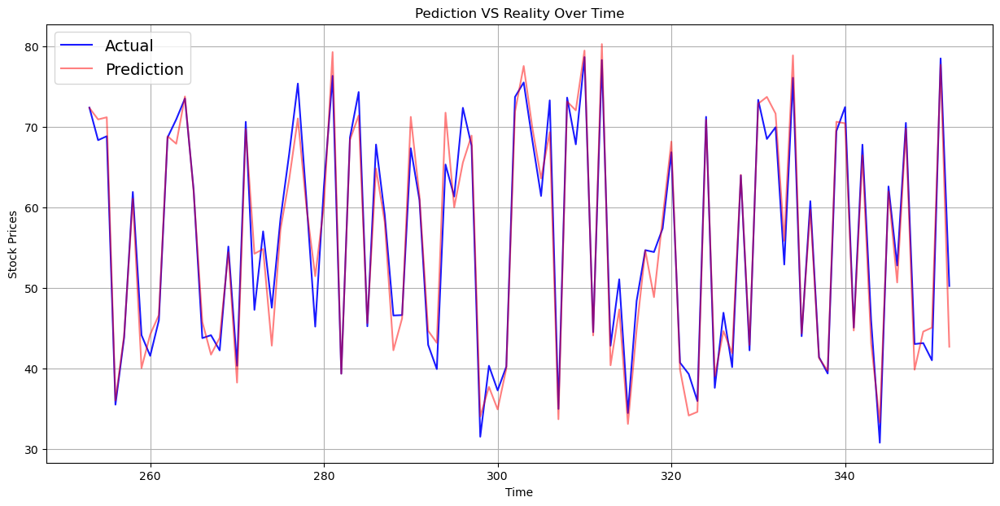

R² Score        : 0.9619
MAE (Error)     : 2.15
RMSE (Error)    : 2.75
Maximum Actual Price: 83.23
Maximum Predicted Price  : 81.29
Minimum Actual Price   : 24.45
Minimum Predicted Price  : 31.55
Ticker symbol : BAC
Security : Bank of America Corp
SEC filings : reports
GICS Sector : Financials
GICS Sub Industry : Banks
Address of Headquarters : Charlotte, North Carolina
CIK : 70858
Red - Predicted Stock Prices  ,  Blue - Actual Stock Prices


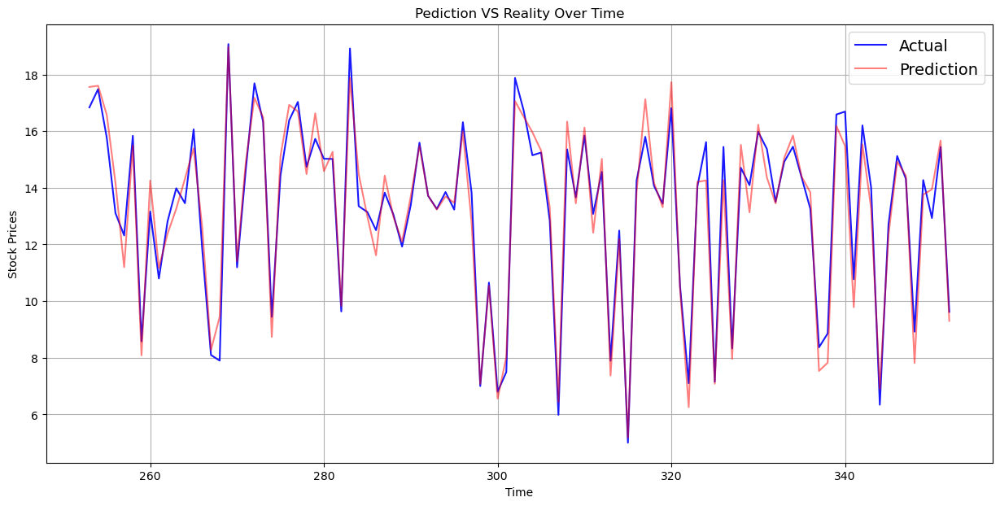

R² Score        : 0.9645
MAE (Error)     : 0.55
RMSE (Error)    : 0.68
Maximum Actual Price: 23.11
Maximum Predicted Price  : 22.91
Minimum Actual Price   : 4.93
Minimum Predicted Price  : 5.10
Ticker symbol : BCR
Security : Bard (C.R.) Inc.
SEC filings : reports
GICS Sector : Health Care
GICS Sub Industry : Health Care Equipment
Address of Headquarters : Murray Hill, New Jersey
CIK : 9892
Red - Predicted Stock Prices  ,  Blue - Actual Stock Prices


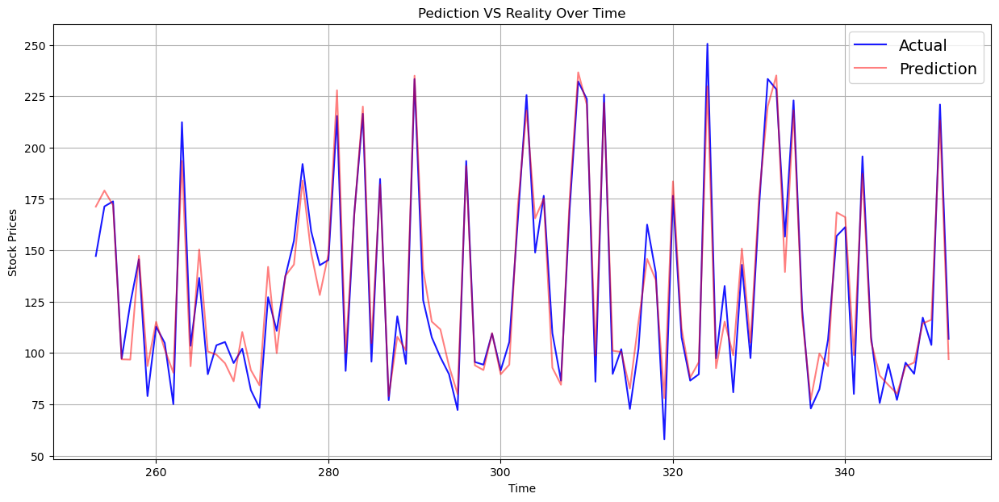

R² Score        : 0.9569
MAE (Error)     : 8.31
RMSE (Error)    : 10.11
Maximum Actual Price: 250.54
Maximum Predicted Price  : 237.96
Minimum Actual Price   : 56.76
Minimum Predicted Price  : 76.87
Ticker symbol : BAX
Security : Baxter International Inc.
SEC filings : reports
GICS Sector : Health Care
GICS Sub Industry : Health Care Equipment
Address of Headquarters : Deerfield, Illinois
CIK : 10456
Red - Predicted Stock Prices  ,  Blue - Actual Stock Prices


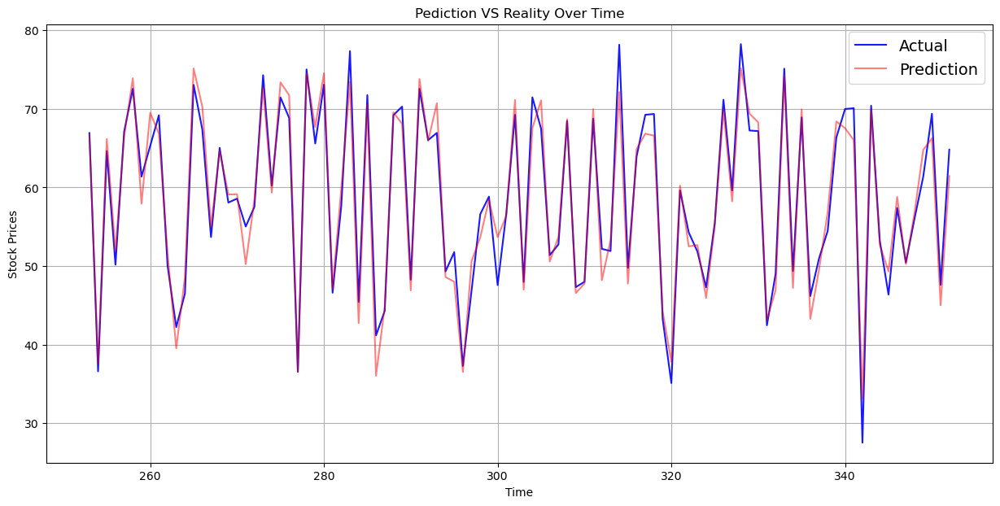

R² Score        : 0.9583
MAE (Error)     : 1.95
RMSE (Error)    : 2.40
Maximum Actual Price: 80.32
Maximum Predicted Price  : 76.76
Minimum Actual Price   : 27.52
Minimum Predicted Price  : 32.38
Ticker symbol : BBT
Security : BB&T Corporation
SEC filings : reports
GICS Sector : Financials
GICS Sub Industry : Banks
Address of Headquarters : Winston-Salem, North Carolina
CIK : 92230
Red - Predicted Stock Prices  ,  Blue - Actual Stock Prices


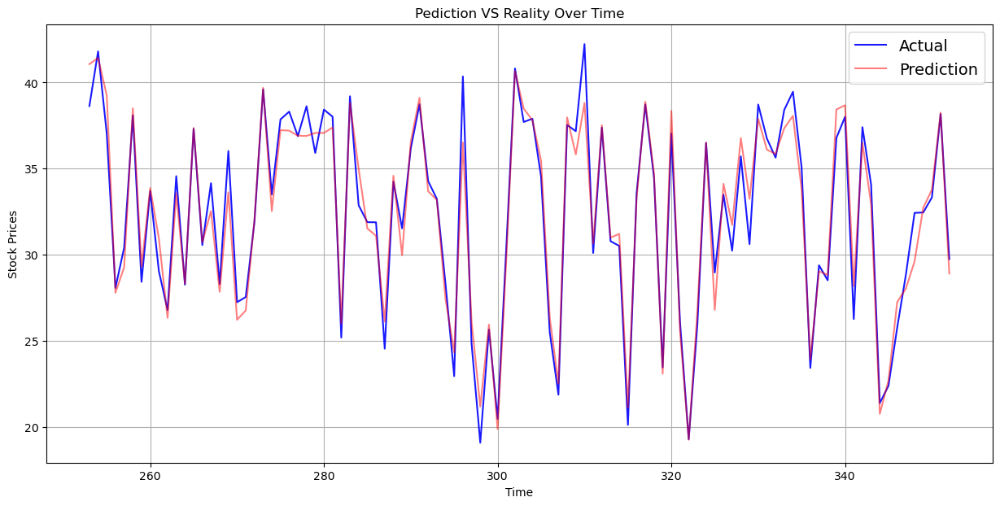

R² Score        : 0.9639
MAE (Error)     : 0.89
RMSE (Error)    : 1.12
Maximum Actual Price: 48.24
Maximum Predicted Price  : 47.61
Minimum Actual Price   : 19.11
Minimum Predicted Price  : 19.28
Ticker symbol : BDX
Security : Becton Dickinson
SEC filings : reports
GICS Sector : Health Care
GICS Sub Industry : Health Care Equipment
Address of Headquarters : Franklin Lakes, New Jersey
CIK : 10795
Red - Predicted Stock Prices  ,  Blue - Actual Stock Prices


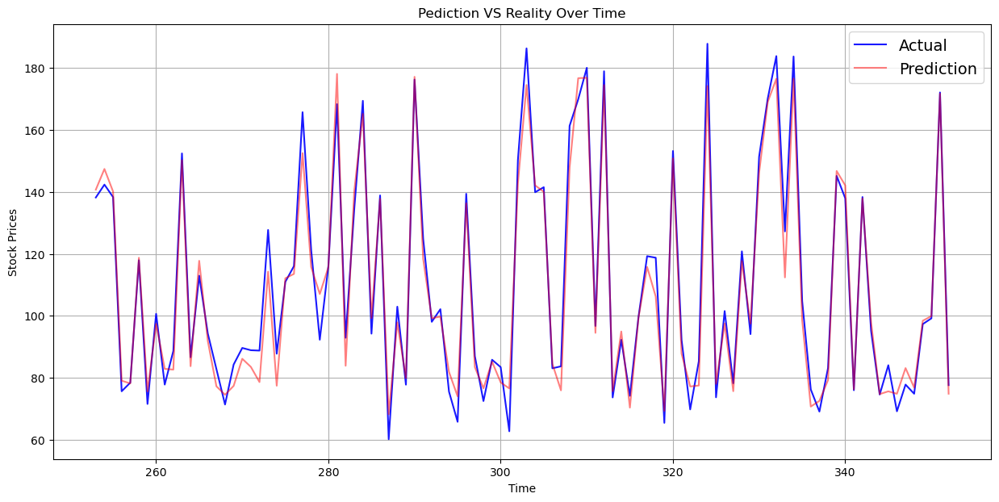

R² Score        : 0.9622
MAE (Error)     : 5.52
RMSE (Error)    : 6.89
Maximum Actual Price: 187.83
Maximum Predicted Price  : 180.73
Minimum Actual Price   : 56.24
Minimum Predicted Price  : 66.72
Ticker symbol : BBBY
Security : Bed Bath & Beyond
SEC filings : reports
GICS Sector : Consumer Discretionary
GICS Sub Industry : Specialty Stores
Address of Headquarters : Union, New Jersey
CIK : 886158
Red - Predicted Stock Prices  ,  Blue - Actual Stock Prices


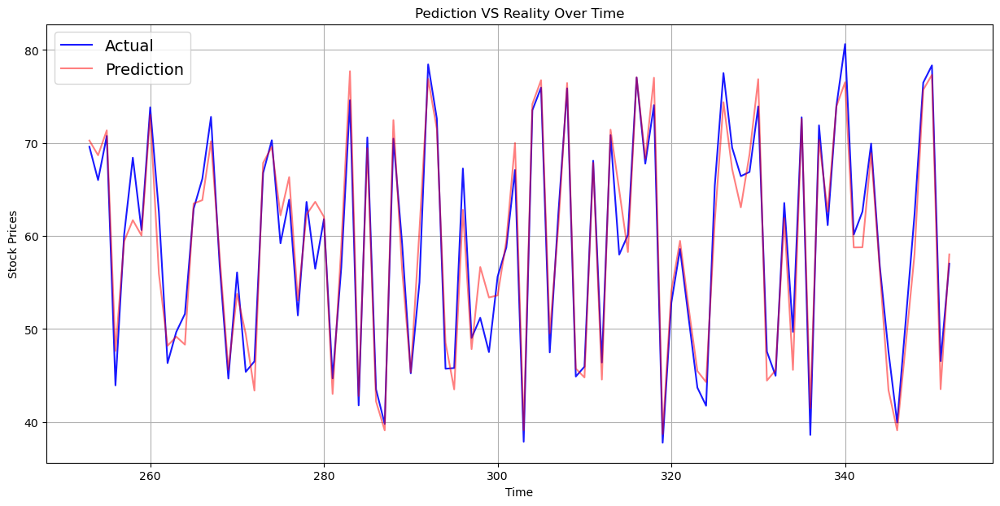

R² Score        : 0.9578
MAE (Error)     : 1.92
RMSE (Error)    : 2.40
Maximum Actual Price: 80.86
Maximum Predicted Price  : 80.07
Minimum Actual Price   : 34.55
Minimum Predicted Price  : 36.37
Ticker symbol : BRK.B
Security : Berkshire Hathaway
SEC filings : reports
GICS Sector : Financials
GICS Sub Industry : Multi-Sector Holdings
Address of Headquarters : Omaha, Nebraska
CIK : 1067983


ValueError: Found array with 0 sample(s) (shape=(0, 3)) while a minimum of 1 is required by StandardScaler.

In [79]:
Model_Prediction()